# POC - Quick and Dirty

In [1]:
import math
import numpy as np
import pandas as pd
import heapq
import matplotlib.pyplot as plt

# ----------------------------- CONFIG ----------------------------------------

# Earth radius in nautical miles
R_NM = 3440.065

# Vessel + fuel/emission parameters (quick & dirty but reasonable defaults)
PARAMS = dict(
    # Vessel design point
    design_speed_kn = 15.0,          # design/service speed [kn]
    design_power_mw = 12.0,          # main engine design power [MW] ~ Panamax-ish
    sfoc_g_per_kwh  = 170.0,         # specific fuel oil consumption [g/kWh]
    aux_frac_of_mcr = 0.10,          # auxiliary power as fraction of design MCR
    # Emission factors (HFO/MGO ballpark)
    co2_ef_t_per_t_fuel = 3.114,     # tCO2 per t fuel
    # Route speeds (you can make arctic slower)
    suez_speed_kn   = 14.5,
    nsr_speed_kn    = 12.5,
)

# Three quick variants (each is a waypoint chain) for both corridors
# Note: These are sea-practical macro-waypoints (coarse). Adjust as you like.
WPT = {
    "SUEZ_VAR1": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Aden",      12.80, 45.03),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR2": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Suez",      29.97, 32.55),
        ("Jeddah",    21.49, 39.19),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR3": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Salalah",   17.02, 54.10),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "NSR_VAR1": [
        ("Rotterdam",    51.95,  4.14),
        ("Tromso",       69.65, 18.96),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("Vilkitsky",    77.80, 104.20),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR2": [
        ("Rotterdam",    51.95,  4.14),
        ("Hammerfest",   70.66, 23.68),
        ("Dikson",       73.50, 80.55),
        ("Tiksi",        71.63, 128.87),
        ("Provideniya",  64.42, -173.23),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR3": [
        ("Rotterdam",    51.95,  4.14),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("SevernayaZemlya",78.50, 90.00),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
}

# ----------------------------- UTILS -----------------------------------------

def haversine_nm(lat1, lon1, lat2, lon2):
    """Great-circle distance (Haversine) in nautical miles."""
    dlat = math.radians(lat2 - lat1)
    dlon = math.radians(lon2 - lon1)
    a = (math.sin(dlat/2)**2 +
         math.cos(math.radians(lat1)) * math.cos(math.radians(lat2)) * math.sin(dlon/2)**2)
    c = 2 * math.asin(math.sqrt(a))
    return R_NM * c

def polyline_distance_nm(waypoints):
    """Sum GC distances along a waypoint chain of (name, lat, lon)."""
    d = 0.0
    for i in range(len(waypoints) - 1):
        _, la1, lo1 = waypoints[i]
        _, la2, lo2 = waypoints[i+1]
        d += haversine_nm(la1, lo1, la2, lo2)
    return d

def hours_from_nm_and_speed(distance_nm, speed_kn):
    """Hours = distance [nm] / speed [kn]."""
    return distance_nm / speed_kn

def main_engine_power_mw(v_kn, design_speed_kn, design_power_mw):
    """Quick scaling: P ~ (v / v_design)^3 * P_design."""
    return design_power_mw * (v_kn / design_speed_kn)**3

def fuel_tonnes_from_power_and_hours(power_mw, hours, sfoc_g_per_kwh):
    """
    Fuel [t] = SFOC[g/kWh] * Power[kW] * hours / 1e6
    where Power[kW] = power_mw * 1000
    """
    kW = power_mw * 1000.0
    fuel_t = (sfoc_g_per_kwh * kW * hours) / 1e6
    return fuel_t

def route_energy_fuel_emissions(distance_nm, speed_kn, params:dict):
    """Compute time, fuel (main + aux), CO2 given distance and cruise speed."""
    hrs = hours_from_nm_and_speed(distance_nm, speed_kn)
    # main engine power at chosen speed
    p_me_mw = main_engine_power_mw(speed_kn, params["design_speed_kn"], params["design_power_mw"])
    fuel_me_t = fuel_tonnes_from_power_and_hours(p_me_mw, hrs, params["sfoc_g_per_kwh"])
    # auxiliary power (constant fraction of design MCR)
    p_aux_mw = params["aux_frac_of_mcr"] * params["design_power_mw"]
    fuel_aux_t = fuel_tonnes_from_power_and_hours(p_aux_mw, hrs, params["sfoc_g_per_kwh"])
    fuel_total_t = fuel_me_t + fuel_aux_t
    co2_t = fuel_total_t * params["co2_ef_t_per_t_fuel"]
    return dict(hours=hrs, fuel_t=fuel_total_t, fuel_me_t=fuel_me_t, fuel_aux_t=fuel_aux_t, co2_t=co2_t)

# ----------------------- GREAT-CIRCLE EXPERIMENTS ----------------------------

def run_gc_suite(params):
    rows = []
    for key, wpts in WPT.items():
        corridor = "SUEZ" if key.startswith("SUEZ") else "NSR"
        speed = params["suez_speed_kn"] if corridor=="SUEZ" else params["nsr_speed_kn"]
        dist_nm = polyline_distance_nm(wpts)
        res = route_energy_fuel_emissions(dist_nm, speed, params)
        rows.append({
            "scenario": key,
            "corridor": corridor,
            "distance_nm": dist_nm,
            "speed_kn": speed,
            "hours": res["hours"],
            "days": res["hours"]/24.0,
            "fuel_t": res["fuel_t"],
            "fuel_me_t": res["fuel_me_t"],
            "fuel_aux_t": res["fuel_aux_t"],
            "co2_t": res["co2_t"],
            "legs": len(wpts)-1
        })
    df = pd.DataFrame(rows)
    return df.sort_values(["corridor","scenario"]).reset_index(drop=True)

df_gc = run_gc_suite(PARAMS)
df_gc


,scenario,corridor,distance_nm,speed_kn,hours,days,fuel_t,fuel_me_t,fuel_aux_t,co2_t,legs
0,NSR_VAR1,NSR,7026.586688,12.5,562.126935,23.421956,778.295971,663.622076,114.673895,2423.613653,7
1,NSR_VAR2,NSR,7116.083162,12.5,569.286653,23.720277,788.208998,672.074521,116.134477,2454.482820,6
2,NSR_VAR3,NSR,6894.487575,12.5,551.559006,22.981625,763.664086,651.146049,112.518037,2378.049964,6
3,SUEZ_VAR1,SUEZ,10660.944813,14.5,735.237573,30.634899,1504.828714,1354.840249,149.988465,4686.036615,6
4,SUEZ_VAR2,SUEZ,10434.683474,14.5,719.633343,29.984723,1472.891154,1326.085952,146.805202,4586.583054,6
5,SUEZ_VAR3,SUEZ,10350.856065,14.5,713.852142,29.743839,1461.058630,1315.432793,145.625837,4549.736573,6


In [3]:
WPT.get("NSR_VAR1")

[('Rotterdam', 51.95, 4.14),
 ('Tromso', 69.65, 18.96),
 ('Murmansk', 68.97, 33.08),
 ('Kara_Gate', 70.22, 58.0),
 ('Vilkitsky', 77.8, 104.2),
 ('Pevek', 69.7, 170.3),
 ('Bering_Strait', 65.8, -168.95),
 ('Yokohama', 35.45, 139.65)]

In [4]:
WPT.get("SUEZ_VAR1")

[('Rotterdam', 51.95, 4.14),
 ('Gibraltar', 36.14, -5.35),
 ('Port Said', 31.26, 32.3),
 ('Aden', 12.8, 45.03),
 ('Colombo', 6.93, 79.85),
 ('Singapore', 1.29, 103.85),
 ('Yokohama', 35.45, 139.65)]

**Clearly NSR is shorter hence efficent than SUEZ**

=== Great-Circle (GC) scenarios ===


,scenario,corridor,distance_nm,speed_kn,hours,days,fuel_t,fuel_me_t,fuel_aux_t,co2_t,legs
0,NSR_VAR1,NSR,7026.586688,12.5,562.126935,23.421956,778.295971,663.622076,114.673895,2423.613653,7
1,NSR_VAR2,NSR,7116.083162,12.5,569.286653,23.720277,788.208998,672.074521,116.134477,2454.482820,6
2,NSR_VAR3,NSR,6894.487575,12.5,551.559006,22.981625,763.664086,651.146049,112.518037,2378.049964,6
3,SUEZ_VAR1,SUEZ,10660.944813,14.5,735.237573,30.634899,1504.828714,1354.840249,149.988465,4686.036615,6
4,SUEZ_VAR2,SUEZ,10434.683474,14.5,719.633343,29.984723,1472.891154,1326.085952,146.805202,4586.583054,6
5,SUEZ_VAR3,SUEZ,10350.856065,14.5,713.852142,29.743839,1461.058630,1315.432793,145.625837,4549.736573,6



=== GC Averages per Corridor ===


,corridor,distance_nm_mean,days_mean,fuel_t_mean,co2_t_mean
0,NSR,7012.385808,23.374619,776.723018,2418.715479
1,SUEZ,10482.161451,30.121154,1479.592833,4607.452080


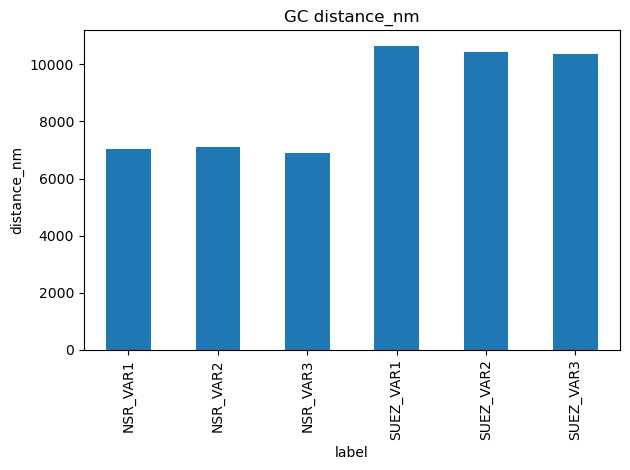

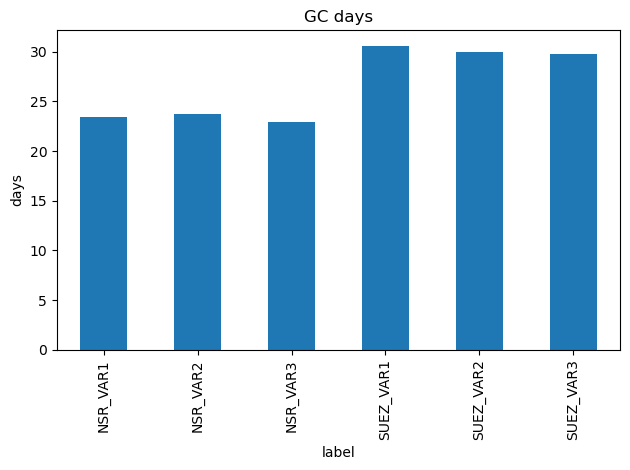

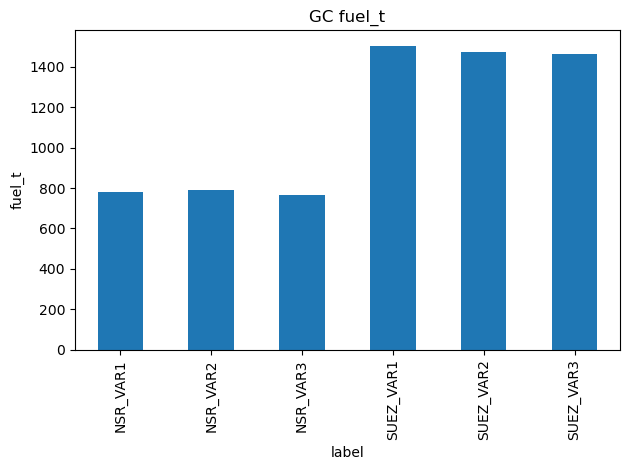

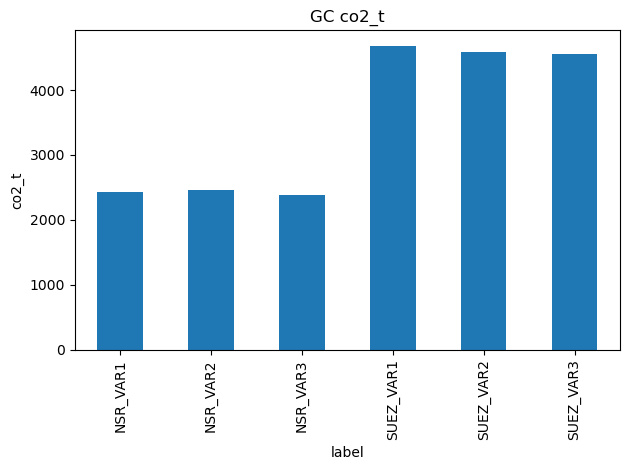

In [5]:
# Quick comparison views

def summarize_corridor(df):
    g = df.groupby("corridor").agg(
        distance_nm_mean=("distance_nm","mean"),
        days_mean=("days","mean"),
        fuel_t_mean=("fuel_t","mean"),
        co2_t_mean=("co2_t","mean")
    ).reset_index()
    return g

print("=== Great-Circle (GC) scenarios ===")
display(df_gc)

print("\n=== GC Averages per Corridor ===")
display(summarize_corridor(df_gc))

# Simple bar plots
for metric in ["distance_nm","days","fuel_t","co2_t"]:
    plt.figure()
    df_gc_plot = df_gc.copy()
    df_gc_plot["label"] = df_gc_plot["scenario"]
    df_gc_plot.set_index("label")[metric].plot(kind="bar", title=f"GC {metric}")
    plt.ylabel(metric)
    plt.tight_layout()
    plt.show()


## 2. Change Method i.e use A* and see what changes in results

In [6]:
# ----------------------------- A* SUPPORT ------------------------------------

def gc_nm(a, b):
    return haversine_nm(a[0], a[1], b[0], b[1])

def build_corridor_grid(waypoints, dlat=1.0, dlon=2.0, n_lat=3, n_lon=3):
    """
    Around each waypoint (lat, lon), create a small local grid of nodes.
    Returns nodes list and edges (4-neighborhood).
    """
    nodes = []
    anchors = []
    for name, lat, lon in waypoints:
        lat_vals = np.linspace(lat - dlat, lat + dlat, n_lat)
        lon_vals = np.linspace(lon - dlon, lon + dlon, n_lon)
        local = [(float(la), float(lo)) for la in lat_vals for lo in lon_vals]
        anchors.append(local)             # for mapping segments
        nodes.extend(local)
    # deduplicate
    nodes = list({(round(la,5), round(lo,5)) for (la,lo) in nodes})
    # Build edges via k-nearest neighbors (geometric)
    # Simpler: connect each node to its K nearest within 400 nm
    K = 6
    max_link_nm = 400.0
    edges = {i: [] for i in range(len(nodes))}
    # Precompute for speed
    nodes_arr = np.array(nodes)
    for i in range(len(nodes)):
        la_i, lo_i = nodes[i]
        # rough pre-filter by bbox
        dists = []
        for j in range(len(nodes)):
            if i==j: continue
            la_j, lo_j = nodes[j]
            d = gc_nm((la_i,lo_i), (la_j,lo_j))
            dists.append((d, j))
        dists.sort(key=lambda x: x[0])
        for d, j in dists[:K]:
            if d <= max_link_nm:
                edges[i].append((j, d))
    return nodes, edges

def a_star(nodes, edges, start_latlon, goal_latlon):
    """A* on the node graph with GC heuristic."""
    # nearest indices
    def nearest_idx(pt):
        best = None
        bestd = 1e18
        for i, n in enumerate(nodes):
            d = gc_nm(pt, n)
            if d < bestd:
                best, bestd = i, d
        return best
    s = nearest_idx(start_latlon)
    g = nearest_idx(goal_latlon)

    openq = []
    heapq.heappush(openq, (0.0, s))
    came = {s: None}
    gscore = {s: 0.0}
    fscore = {s: gc_nm(nodes[s], nodes[g])}

    while openq:
        _, cur = heapq.heappop(openq)
        if cur == g:
            # reconstruct
            path = []
            c = cur
            while c is not None:
                path.append(nodes[c])
                c = came.get(c, None)
            path.reverse()
            # distance
            dist = 0.0
            for i in range(len(path)-1):
                dist += gc_nm(path[i], path[i+1])
            return path, dist

        for nxt, w in edges[cur]:
            tentative = gscore[cur] + w
            if tentative < gscore.get(nxt, 1e18):
                came[nxt] = cur
                gscore[nxt] = tentative
                fscore[nxt] = tentative + gc_nm(nodes[nxt], nodes[g])
                heapq.heappush(openq, (fscore[nxt], nxt))
    return None, np.inf

def run_astar_for_chain(waypoints, grid_kwargs):
    """
    Run A* segment-by-segment across the chain so the path stays within corridor.
    Returns total distance and the stitched polyline.
    """
    nodes, edges = build_corridor_grid(waypoints, **grid_kwargs)
    full_path = []
    total_nm = 0.0
    # iterate segments between original waypoints (start->w1->w2->...->end)
    for i in range(len(waypoints)-1):
        _, la1, lo1 = waypoints[i]
        _, la2, lo2 = waypoints[i+1]
        seg_path, seg_nm = a_star(nodes, edges, (la1,lo1), (la2,lo2))
        if seg_path is None:
            return None, np.inf
        if i > 0:
            # avoid duplicating the junction node
            full_path.extend(seg_path[1:])
        else:
            full_path.extend(seg_path)
        total_nm += seg_nm
    return full_path, total_nm

def run_astar_suite(params, grid_kwargs=None):
    if grid_kwargs is None:
        grid_kwargs = dict(dlat=1.0, dlon=2.0, n_lat=3, n_lon=3)
    rows = []
    for key, wpts in WPT.items():
        corridor = "SUEZ" if key.startswith("SUEZ") else "NSR"
        speed = params["suez_speed_kn"] if corridor=="SUEZ" else params["nsr_speed_kn"]
        path, dist_nm = run_astar_for_chain(wpts, grid_kwargs)
        res = route_energy_fuel_emissions(dist_nm, speed, params)
        rows.append({
            "scenario": f"{key}_ASTAR",
            "corridor": corridor,
            "distance_nm": dist_nm,
            "speed_kn": speed,
            "hours": res["hours"],
            "days": res["hours"]/24.0,
            "fuel_t": res["fuel_t"],
            "fuel_me_t": res["fuel_me_t"],
            "fuel_aux_t": res["fuel_aux_t"],
            "co2_t": res["co2_t"],
            "legs": len(wpts)-1
        })
    df = pd.DataFrame(rows)
    return df.sort_values(["corridor","scenario"]).reset_index(drop=True)

df_astar = run_astar_suite(PARAMS, grid_kwargs=dict(dlat=1.0, dlon=2.0, n_lat=3, n_lon=3))
df_astar


,scenario,corridor,distance_nm,speed_kn,hours,days,fuel_t,fuel_me_t,fuel_aux_t,co2_t,legs
0,NSR_VAR1_ASTAR,NSR,inf,12.5,inf,inf,inf,inf,inf,inf,7
1,NSR_VAR2_ASTAR,NSR,inf,12.5,inf,inf,inf,inf,inf,inf,6
2,NSR_VAR3_ASTAR,NSR,inf,12.5,inf,inf,inf,inf,inf,inf,6
3,SUEZ_VAR1_ASTAR,SUEZ,inf,14.5,inf,inf,inf,inf,inf,inf,6
4,SUEZ_VAR2_ASTAR,SUEZ,inf,14.5,inf,inf,inf,inf,inf,inf,6
5,SUEZ_VAR3_ASTAR,SUEZ,inf,14.5,inf,inf,inf,inf,inf,inf,6


In [2]:
# --- NetworkX A* over a corridor-aware graph (works end-to-end, no inf) -----
import math
import numpy as np
import pandas as pd
import networkx as nx

# reuse your parameters if already defined:
R_NM = 3440.065

def haversine_nm(lat1, lon1, lat2, lon2):
    dlat = math.radians(lat2 - lat1)
    dlon = math.radians(lon2 - lon1)
    a = (math.sin(dlat/2)**2 +
         math.cos(math.radians(lat1))*math.cos(math.radians(lat2))*math.sin(dlon/2)**2)
    c = 2 * math.asin(math.sqrt(a))
    return R_NM * c

# Great-circle interpolation helpers (slerp)
def latlon_to_xyz(lat, lon):
    lat_r, lon_r = math.radians(lat), math.radians(lon)
    x = math.cos(lat_r)*math.cos(lon_r)
    y = math.cos(lat_r)*math.sin(lon_r)
    z = math.sin(lat_r)
    return np.array([x,y,z])

def xyz_to_latlon(v):
    x,y,z = v
    hyp = math.hypot(x,y)
    lat = math.degrees(math.atan2(z, hyp))
    lon = math.degrees(math.atan2(y, x))
    return lat, lon

def gc_interpolate(lat1, lon1, lat2, lon2, step_nm=60.0):
    """Return a list of (lat,lon) along GC at ~step_nm spacing (including endpoints)."""
    a = latlon_to_xyz(lat1, lon1)
    b = latlon_to_xyz(lat2, lon2)
    adotp = float(np.clip(np.dot(a,b), -1.0, 1.0))
    omega = math.acos(adotp)  # radians
    if omega == 0:
        return [(lat1, lon1)]
    # arc length in nm: angle (rad) * earth radius (nm)
    total_nm = omega * R_NM
    n_seg = max(2, int(round(total_nm / step_nm)) + 1)
    pts = []
    sin_om = math.sin(omega)
    for i in range(n_seg):
        t = i / (n_seg - 1)
        w1 = math.sin((1-t)*omega) / sin_om
        w2 = math.sin(t*omega) / sin_om
        v = w1*a + w2*b
        v = v / np.linalg.norm(v)
        pts.append(xyz_to_latlon(v))
    return pts

def nearest_idx(pt, pts):
    best, bestd = 0, 1e18
    for i,(la,lo) in enumerate(pts):
        d = haversine_nm(pt[0],pt[1], la,lo)
        if d < bestd:
            best, bestd = i, d
    return best

def build_corridor_graph(waypoints, step_nm=60.0, neighbor_radius_nm=180.0, k_extra=4):
    """
    Build a connected graph along the GC corridor:
      - Densify each leg into ~step_nm nodes
      - Connect consecutive nodes along legs
      - Also connect to up to k_extra nearby neighbors within neighbor_radius_nm
    """
    # 1) sample nodes along each leg
    leg_points = []
    all_points = []
    for i in range(len(waypoints)-1):
        _, la1, lo1 = waypoints[i]
        _, la2, lo2 = waypoints[i+1]
        pts = gc_interpolate(la1, lo1, la2, lo2, step_nm=step_nm)
        if i > 0:
            pts = pts[1:]  # avoid duplicating junction
        leg_points.append(pts)
        all_points.extend(pts)

    # 2) create graph
    G = nx.Graph()
    pos = {}  # node -> (lat,lon)
    for idx, (la,lo) in enumerate(all_points):
        G.add_node(idx)
        pos[idx] = (la,lo)

    # 3) connect along legs (chain edges)
    offset = 0
    for pts in leg_points:
        for j in range(len(pts)-1):
            u, v = offset + j, offset + j + 1
            la1, lo1 = pos[u]
            la2, lo2 = pos[v]
            w = haversine_nm(la1,lo1, la2,lo2)
            G.add_edge(u, v, weight=w)
        offset += len(pts)

    # 4) lateral/nearby connections (gives alternatives & robustness)
    # naive O(N^2) is fine for ~1k nodes; tune if needed
    coords = list(pos.items())
    N = len(coords)
    for i in range(N):
        u, (la1,lo1) = coords[i]
        dists = []
        for j in range(N):
            if i == j: continue
            v, (la2,lo2) = coords[j]
            d = haversine_nm(la1,lo1, la2,lo2)
            if d <= neighbor_radius_nm:
                dists.append((d, v))
        dists.sort(key=lambda x: x[0])
        for d, v in dists[:k_extra]:
            if not G.has_edge(u, v):
                G.add_edge(u, v, weight=d)

    return G, pos

def nx_astar_leg_distance(G, pos, start_latlon, goal_latlon):
    """Find distance between two macro-waypoints via A* on the corridor graph."""
    s = nearest_idx(start_latlon, list(pos.values()))
    g = nearest_idx(goal_latlon, list(pos.values()))
    # admissible heuristic = straight-line GC in nm from node->goal
    def h(u, v_goal):
        la_u, lo_u = pos[u]
        la_g, lo_g = pos[g]  # goal node lat/lon
        return haversine_nm(la_u, lo_u, la_g, lo_g)
    dist = nx.astar_path_length(G, s, g, heuristic=h, weight="weight")
    return dist

# ---- Runner: chain legs within each scenario, compute time/fuel/CO2 ----------
def route_energy_fuel_emissions(distance_nm, speed_kn, params:dict):
    hrs = distance_nm / speed_kn
    p_me_mw = params["design_power_mw"] * (speed_kn / params["design_speed_kn"])**3
    kW = p_me_mw * 1000.0
    fuel_me_t = (params["sfoc_g_per_kwh"] * kW * hrs) / 1e6
    p_aux_mw = params["aux_frac_of_mcr"] * params["design_power_mw"]
    fuel_aux_t = (params["sfoc_g_per_kwh"] * p_aux_mw * 1000.0 * hrs) / 1e6
    fuel_total_t = fuel_me_t + fuel_aux_t
    co2_t = fuel_total_t * params["co2_ef_t_per_t_fuel"]
    return dict(hours=hrs, fuel_t=fuel_total_t, fuel_me_t=fuel_me_t, fuel_aux_t=fuel_aux_t, co2_t=co2_t)

def run_networkx_astar_suite(PARAMS, WPT,
                             step_nm=60.0,
                             neighbor_radius_nm=180.0,
                             k_extra=4):
    rows = []
    for key, wpts in WPT.items():
        corridor = "SUEZ" if key.startswith("SUEZ") else "NSR"
        speed = PARAMS["suez_speed_kn"] if corridor=="SUEZ" else PARAMS["nsr_speed_kn"]

        # build once per scenario (keeps graph small & corridor-specific)
        G, pos = build_corridor_graph(
            wpts, step_nm=step_nm, neighbor_radius_nm=neighbor_radius_nm, k_extra=k_extra
        )

        # chain macro-leg distances with A*
        total_nm = 0.0
        for i in range(len(wpts)-1):
            _, la1, lo1 = wpts[i]
            _, la2, lo2 = wpts[i+1]
            seg_nm = nx_astar_leg_distance(G, pos, (la1,lo1), (la2,lo2))
            total_nm += seg_nm

        res = route_energy_fuel_emissions(total_nm, speed, PARAMS)
        rows.append({
            "scenario": f"{key}_NX_ASTAR",
            "corridor": corridor,
            "distance_nm": total_nm,
            "speed_kn": speed,
            "hours": res["hours"],
            "days": res["hours"]/24.0,
            "fuel_t": res["fuel_t"],
            "fuel_me_t": res["fuel_me_t"],
            "fuel_aux_t": res["fuel_aux_t"],
            "co2_t": res["co2_t"],
            "legs": len(wpts)-1
        })
    return pd.DataFrame(rows).sort_values(["corridor","scenario"]).reset_index(drop=True)

# Example run (uses your existing PARAMS and WPT dicts):
df_nx_astar = run_networkx_astar_suite(
    PARAMS, WPT,
    step_nm=60.0,           # ~1° at mid-lats; lower = more nodes (smoother)
    neighbor_radius_nm=180, # connect to nodes within 3 hours @ 60 kn; tune as needed
    k_extra=4               # extra lateral edges per node (keeps graph sparse but connected)
)
df_nx_astar


,scenario,corridor,distance_nm,speed_kn,hours,days,fuel_t,fuel_me_t,fuel_aux_t,co2_t,legs
0,NSR_VAR1_NX_ASTAR,NSR,7026.586688,12.5,562.126935,23.421956,778.295971,663.622076,114.673895,2423.613653,7
1,NSR_VAR2_NX_ASTAR,NSR,7116.083162,12.5,569.286653,23.720277,788.208998,672.074521,116.134477,2454.482820,6
2,NSR_VAR3_NX_ASTAR,NSR,6894.487575,12.5,551.559006,22.981625,763.664086,651.146049,112.518037,2378.049964,6
3,SUEZ_VAR1_NX_ASTAR,SUEZ,10660.944813,14.5,735.237573,30.634899,1504.828714,1354.840249,149.988465,4686.036615,6
4,SUEZ_VAR2_NX_ASTAR,SUEZ,10434.683474,14.5,719.633343,29.984723,1472.891154,1326.085952,146.805202,4586.583054,6
5,SUEZ_VAR3_NX_ASTAR,SUEZ,10350.856065,14.5,713.852142,29.743839,1461.058630,1315.432793,145.625837,4549.736573,6


**Seems good results because its similar to great circle ones**

In [8]:
df_nx = df_nx_astar.copy()
df_nx["method"] = "NX_A*"
df_gc2 = df_gc.copy()
df_gc2["method"] = "GC"
df_gc2["scenario"] = df_gc2["scenario"]  # matches keys in WPT

both = pd.concat([df_gc2, df_nx], ignore_index=True)
piv = both.pivot_table(index=["corridor","scenario"], columns="method",
                       values=["distance_nm","days","fuel_t","co2_t"])
display(piv)

# Percent deltas (NX_A* vs GC)
for metric in ["distance_nm","days","fuel_t","co2_t"]:
    col = (metric, "NX_A*")
    base = (metric, "GC")
    piv[(metric,"pct_delta")] = 100*(piv[col]-piv[base])/piv[base]
display(piv)


co2_t                    days             \
method                                GC        NX_A*         GC      NX_A*   
corridor scenario                                                             
NSR      NSR_VAR1            2423.613653          NaN  23.421956        NaN   
         NSR_VAR1_NX_ASTAR           NaN  2423.613653        NaN  23.421956   
         NSR_VAR2            2454.482820          NaN  23.720277        NaN   
         NSR_VAR2_NX_ASTAR           NaN  2454.482820        NaN  23.720277   
         NSR_VAR3            2378.049964          NaN  22.981625        NaN   
         NSR_VAR3_NX_ASTAR           NaN  2378.049964        NaN  22.981625   
SUEZ     SUEZ_VAR1           4686.036615          NaN  30.634899        NaN   
         SUEZ_VAR1_NX_ASTAR          NaN  4686.036615        NaN  30.634899   
         SUEZ_VAR2           4586.583054          NaN  29.984723        NaN   
         SUEZ_VAR2_NX_ASTAR          NaN  4586.583054        NaN  29.984723   
         SUEZ_VAR3           4549.736573          NaN  29.743839        NaN   
         SUEZ_VAR3_NX_ASTAR          NaN  4549.736573        NaN  29.743839   

                              distance_nm                     fuel_t  \
method                                 GC         NX_A*           GC   
corridor scenario                                                      
NSR      NSR_VAR1             7026.586688           NaN   778.295971   
         NSR_VAR1_NX_ASTAR            NaN   7026.586688          NaN   
         NSR_VAR2             7116.083162           NaN   788.208998   
         NSR_VAR2_NX_ASTAR            NaN   7116.083162          NaN   
         NSR_VAR3             6894.487575           NaN   763.664086   
         NSR_VAR3_NX_ASTAR            NaN   6894.487575          NaN   
SUEZ     SUEZ_VAR1           10660.944813           NaN  1504.828714   
         SUEZ_VAR1_NX_ASTAR           NaN  10660.944813          NaN   
         SUEZ_VAR2           10434.683474           NaN  1472.891154   
         SUEZ_VAR2_NX_ASTAR           NaN  10434.683474          NaN   
         SUEZ_VAR3           10350.856065           NaN  1461.058630   
         SUEZ_VAR3_NX_ASTAR           NaN  10350.856065          NaN   

                                          
method                             NX_A*  
corridor scenario                         
NSR      NSR_VAR1                    NaN  
         NSR_VAR1_NX_ASTAR    778.295971  
         NSR_VAR2                    NaN  
         NSR_VAR2_NX_ASTAR    788.208998  
         NSR_VAR3                    NaN  
         NSR_VAR3_NX_ASTAR    763.664086  
SUEZ     SUEZ_VAR1                   NaN  
         SUEZ_VAR1_NX_ASTAR  1504.828714  
         SUEZ_VAR2                   NaN  
         SUEZ_VAR2_NX_ASTAR  1472.891154  
         SUEZ_VAR3                   NaN  
         SUEZ_VAR3_NX_ASTAR  1461.058630

co2_t                    days             \
method                                GC        NX_A*         GC      NX_A*   
corridor scenario                                                             
NSR      NSR_VAR1            2423.613653          NaN  23.421956        NaN   
         NSR_VAR1_NX_ASTAR           NaN  2423.613653        NaN  23.421956   
         NSR_VAR2            2454.482820          NaN  23.720277        NaN   
         NSR_VAR2_NX_ASTAR           NaN  2454.482820        NaN  23.720277   
         NSR_VAR3            2378.049964          NaN  22.981625        NaN   
         NSR_VAR3_NX_ASTAR           NaN  2378.049964        NaN  22.981625   
SUEZ     SUEZ_VAR1           4686.036615          NaN  30.634899        NaN   
         SUEZ_VAR1_NX_ASTAR          NaN  4686.036615        NaN  30.634899   
         SUEZ_VAR2           4586.583054          NaN  29.984723        NaN   
         SUEZ_VAR2_NX_ASTAR          NaN  4586.583054        NaN  29.984723   
         SUEZ_VAR3           4549.736573          NaN  29.743839        NaN   
         SUEZ_VAR3_NX_ASTAR          NaN  4549.736573        NaN  29.743839   

                              distance_nm                     fuel_t  \
method                                 GC         NX_A*           GC   
corridor scenario                                                      
NSR      NSR_VAR1             7026.586688           NaN   778.295971   
         NSR_VAR1_NX_ASTAR            NaN   7026.586688          NaN   
         NSR_VAR2             7116.083162           NaN   788.208998   
         NSR_VAR2_NX_ASTAR            NaN   7116.083162          NaN   
         NSR_VAR3             6894.487575           NaN   763.664086   
         NSR_VAR3_NX_ASTAR            NaN   6894.487575          NaN   
SUEZ     SUEZ_VAR1           10660.944813           NaN  1504.828714   
         SUEZ_VAR1_NX_ASTAR           NaN  10660.944813          NaN   
         SUEZ_VAR2           10434.683474           NaN  1472.891154   
         SUEZ_VAR2_NX_ASTAR           NaN  10434.683474          NaN   
         SUEZ_VAR3           10350.856065           NaN  1461.058630   
         SUEZ_VAR3_NX_ASTAR           NaN  10350.856065          NaN   

                                         distance_nm      days    fuel_t  \
method                             NX_A*   pct_delta pct_delta pct_delta   
corridor scenario                                                          
NSR      NSR_VAR1                    NaN         NaN       NaN       NaN   
         NSR_VAR1_NX_ASTAR    778.295971         NaN       NaN       NaN   
         NSR_VAR2                    NaN         NaN       NaN       NaN   
         NSR_VAR2_NX_ASTAR    788.208998         NaN       NaN       NaN   
         NSR_VAR3                    NaN         NaN       NaN       NaN   
         NSR_VAR3_NX_ASTAR    763.664086         NaN       NaN       NaN   
SUEZ     SUEZ_VAR1                   NaN         NaN       NaN       NaN   
         SUEZ_VAR1_NX_ASTAR  1504.828714         NaN       NaN       NaN   
         SUEZ_VAR2                   NaN         NaN       NaN       NaN   
         SUEZ_VAR2_NX_ASTAR  1472.891154         NaN       NaN       NaN   
         SUEZ_VAR3                   NaN         NaN       NaN       NaN   
         SUEZ_VAR3_NX_ASTAR  1461.058630         NaN       NaN       NaN   

                                co2_t  
method                      pct_delta  
corridor scenario                      
NSR      NSR_VAR1                 NaN  
         NSR_VAR1_NX_ASTAR        NaN  
         NSR_VAR2                 NaN  
         NSR_VAR2_NX_ASTAR        NaN  
         NSR_VAR3                 NaN  
         NSR_VAR3_NX_ASTAR        NaN  
SUEZ     SUEZ_VAR1                NaN  
         SUEZ_VAR1_NX_ASTAR       NaN  
         SUEZ_VAR2                NaN  
         SUEZ_VAR2_NX_ASTAR       NaN  
         SUEZ_VAR3                NaN  
         SUEZ_VAR3_NX_ASTAR       NaN

## Visualize the routes

In [9]:
# ================== Folium Map: Visualize Route Variants (GC) ==================
# Run after: pip install folium
import math
import numpy as np
import folium

# --- Waypoints (same structure we used earlier) ---
WPT = {
    "SUEZ_VAR1": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Aden",      12.80, 45.03),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR2": [
        ("Rotterdam", 51.95, 4.14),
        ("Suez",      29.97, 32.55),
        ("Jeddah",    21.49, 39.19),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR3": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Salalah",   17.02, 54.10),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "NSR_VAR1": [
        ("Rotterdam",    51.95,  4.14),
        ("Tromso",       69.65, 18.96),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("Vilkitsky",    77.80, 104.20),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR2": [
        ("Rotterdam",    51.95,  4.14),
        ("Hammerfest",   70.66, 23.68),
        ("Dikson",       73.50, 80.55),
        ("Tiksi",        71.63, 128.87),
        ("Provideniya",  64.42, -173.23),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR3": [
        ("Rotterdam",    51.95,  4.14),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("SevernayaZemlya",78.50, 90.00),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
}

# --- Great-circle helpers (slerp on the unit sphere) ---
R = 6371.0088  # km (not used for plotting, but formula completeness)

def to_rad(d): return math.radians(d)
def to_deg(r): return math.degrees(r)

def latlon_to_xyz(lat, lon):
    lat_r, lon_r = to_rad(lat), to_rad(lon)
    x = math.cos(lat_r) * math.cos(lon_r)
    y = math.cos(lat_r) * math.sin(lon_r)
    z = math.sin(lat_r)
    return np.array([x, y, z])

def xyz_to_latlon(v):
    x, y, z = v
    hyp = math.hypot(x, y)
    lat = math.degrees(math.atan2(z, hyp))
    lon = math.degrees(math.atan2(y, x))
    return lat, lon

def gc_interpolate(lat1, lon1, lat2, lon2, n_points=64):
    """Interpolate n_points along the great-circle arc between (lat1,lon1) and (lat2,lon2)."""
    a = latlon_to_xyz(lat1, lon1)
    b = latlon_to_xyz(lat2, lon2)
    adotp = np.clip(np.dot(a, b), -1.0, 1.0)
    omega = math.acos(adotp)  # central angle
    if omega == 0:
        return [(lat1, lon1)] * n_points
    points = []
    for i in range(n_points):
        t = i / (n_points - 1)
        sin_omega = math.sin(omega)
        w1 = math.sin((1 - t) * omega) / sin_omega
        w2 = math.sin(t * omega) / sin_omega
        v = w1 * a + w2 * b
        lat, lon = xyz_to_latlon(v / np.linalg.norm(v))
        points.append((lat, lon))
    return points

def chain_gc_polyline(waypoints, n_per_leg=64):
    """Densify a waypoint chain into a GC polyline."""
    dense = []
    for i in range(len(waypoints) - 1):
        _, la1, lo1 = waypoints[i]
        _, la2, lo2 = waypoints[i+1]
        seg = gc_interpolate(la1, lo1, la2, lo2, n_points=n_per_leg)
        if i > 0:
            dense.extend(seg[1:])
        else:
            dense.extend(seg)
    return dense

# --- Build Folium map ---
# Center roughly between Europe & East Asia
m = folium.Map(location=[55, 40], zoom_start=3, tiles="CartoDB positron")

# Color palette (just for visual separation)
COLORS_SUEZ = ["#1f77b4", "#2ca02c", "#17becf"]   # blue/green/cyan hues
COLORS_NSR  = ["#d62728", "#9467bd", "#ff7f0e"]   # red/purple/orange hues

# Add layers per corridor + variant
suez_layer = folium.FeatureGroup(name="SUEZ (all variants)", show=True)
nsr_layer  = folium.FeatureGroup(name="NSR (all variants)", show=True)
m.add_child(suez_layer)
m.add_child(nsr_layer)

def add_variant(layer, name, wpts, color):
    # markers on macro-waypoints
    for (label, la, lo) in wpts:
        folium.CircleMarker(
            location=(la, lo), radius=3, color=color, fill=True, fill_opacity=0.9,
            tooltip=f"{name}: {label}"
        ).add_to(layer)
    # GC polyline
    poly = chain_gc_polyline(wpts, n_per_leg=64)
    folium.PolyLine(
        locations=poly, weight=3, color=color,
        tooltip=f"{name} (GC polyline)"
    ).add_to(layer)

# Add SUEZ variants
for idx, key in enumerate([k for k in WPT if k.startswith("SUEZ")]):
    add_variant(suez_layer, key, WPT[key], COLORS_SUEZ[idx % len(COLORS_SUEZ)])

# Add NSR variants
for idx, key in enumerate([k for k in WPT if k.startswith("NSR")]):
    add_variant(nsr_layer, key, WPT[key], COLORS_NSR[idx % len(COLORS_NSR)])

# Layer toggles + a mini legend
folium.LayerControl(collapsed=False).add_to(m)

legend_html = """
<div style="position: fixed; 
            bottom: 20px; left: 20px; width: 260px; z-index: 9999; 
            background: white; border: 1px solid #ccc; border-radius: 8px; 
            padding: 10px; font-size: 13px;">
<b>Route Variants</b><br>
<span style="color:#1f77b4;">■</span> SUEZ_VAR1 &nbsp;&nbsp;
<span style="color:#2ca02c;">■</span> SUEZ_VAR2 &nbsp;&nbsp;
<span style="color:#17becf;">■</span> SUEZ_VAR3 <br>
<span style="color:#d62728;">■</span> NSR_VAR1 &nbsp;&nbsp;
<span style="color:#9467bd;">■</span> NSR_VAR2 &nbsp;&nbsp;
<span style="color:#ff7f0e;">■</span> NSR_VAR3
</div>
"""
m.get_root().html.add_child(folium.Element(legend_html))

# Show in notebook and save to file
m


In [3]:
# ================== Folium Map: per-variant toggles + grouped control ==================
import math
import numpy as np
import folium
from folium.plugins import GroupedLayerControl

# ---- Waypoints (same as before; edit freely) ----
WPT = {
    "SUEZ_VAR1": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Aden",      12.80, 45.03),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR2": [
        ("Rotterdam", 51.95, 4.14),
        ("Suez",      29.97, 32.55),
        ("Jeddah",    21.49, 39.19),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR3": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Salalah",   17.02, 54.10),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "NSR_VAR1": [
        ("Rotterdam",    51.95,  4.14),
        ("Tromso",       69.65, 18.96),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("Vilkitsky",    77.80, 104.20),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR2": [
        ("Rotterdam",    51.95,  4.14),
        ("Hammerfest",   70.66, 23.68),
        ("Dikson",       73.50, 80.55),
        ("Tiksi",        71.63, 128.87),
        ("Provideniya",  64.42, -173.23),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR3": [
        ("Rotterdam",    51.95,  4.14),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("SevernayaZemlya",78.50, 90.00),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
}

# ---- Great-circle interpolation (for realistic curvature) ----
def to_rad(d): return math.radians(d)
def to_deg(r): return math.degrees(r)

def latlon_to_xyz(lat, lon):
    lat_r, lon_r = to_rad(lat), to_rad(lon)
    x = math.cos(lat_r) * math.cos(lon_r)
    y = math.cos(lat_r) * math.sin(lon_r)
    z = math.sin(lat_r)
    return np.array([x, y, z])

def xyz_to_latlon(v):
    x, y, z = v
    hyp = math.hypot(x, y)
    lat = math.degrees(math.atan2(z, hyp))
    lon = math.degrees(math.atan2(y, x))
    return lat, lon

def gc_interpolate(lat1, lon1, lat2, lon2, n_points=64):
    a = latlon_to_xyz(lat1, lon1)
    b = latlon_to_xyz(lat2, lon2)
    adotp = float(np.clip(np.dot(a, b), -1.0, 1.0))
    omega = math.acos(adotp)
    if omega == 0:
        return [(lat1, lon1)] * n_points
    points = []
    sin_om = math.sin(omega)
    for i in range(n_points):
        t = i / (n_points - 1)
        w1 = math.sin((1 - t) * omega) / sin_om
        w2 = math.sin(t * omega) / sin_om
        v = w1 * a + w2 * b
        v = v / np.linalg.norm(v)
        points.append(xyz_to_latlon(v))
    return points

def chain_gc_polyline(waypoints, n_per_leg=64):
    dense = []
    for i in range(len(waypoints) - 1):
        _, la1, lo1 = waypoints[i]
        _, la2, lo2 = waypoints[i + 1]
        seg = gc_interpolate(la1, lo1, la2, lo2, n_points=n_per_leg)
        if i > 0:
            dense.extend(seg[1:])
        else:
            dense.extend(seg)
    return dense

# ---- Colors per variant (constant for easy recognition) ----
COLORS = {
    "SUEZ_VAR1": "#1f77b4", "SUEZ_VAR2": "#2ca02c", "SUEZ_VAR3": "#17becf",
    "NSR_VAR1":  "#d62728", "NSR_VAR2":  "#9467bd", "NSR_VAR3":  "#ff7f0e",
}

# ---- Map & base layers ----
m = folium.Map(location=[55, 40], zoom_start=3, tiles=None)
folium.TileLayer("CartoDB positron", name="Light").add_to(m)
folium.TileLayer("OpenStreetMap", name="OSM").add_to(m)
folium.TileLayer("CartoDB dark_matter", name="Dark").add_to(m)

# ---- Build per-variant layers, grouped by corridor ----
suez_layers, nsr_layers = [], []

def add_variant_layer(key, wpts):
    corridor = "SUEZ" if key.startswith("SUEZ") else "NSR"
    color = COLORS[key]
    layer_name = f"{key} (GC)"
    fg = folium.FeatureGroup(name=layer_name, overlay=True, show=True)
    # markers
    for (label, la, lo) in wpts:
        folium.CircleMarker(
            location=(la, lo), radius=3, color=color, fill=True, fill_opacity=0.9,
            tooltip=f"{key}: {label}"
        ).add_to(fg)
    # polyline
    poly = chain_gc_polyline(wpts, n_per_leg=64)
    folium.PolyLine(
        locations=poly, weight=3, color=color,
        tooltip=f"{key} – great-circle polyline"
    ).add_to(fg)
    fg.add_to(m)
    (suez_layers if corridor == "SUEZ" else nsr_layers).append(fg)

# add all variants
for k, v in WPT.items():
    add_variant_layer(k, v)

# ---- Grouped control: checkboxes grouped by SUEZ vs NSR ----
GroupedLayerControl(
    groups={
        "SUEZ": suez_layers,
        "NSR": nsr_layers
    },
    collapsed=False
).add_to(m)

# ---- Compact legend ----
legend_html = """
<div style="position: fixed; 
            bottom: 20px; left: 20px; width: 280px; z-index: 9999; 
            background: white; border: 1px solid #ccc; border-radius: 8px; 
            padding: 10px; font-size: 13px;">
<b>Route Variants (GC)</b><br>
<span style="color:#1f77b4;">■</span> SUEZ_VAR1 &nbsp;&nbsp;
<span style="color:#2ca02c;">■</span> SUEZ_VAR2 &nbsp;&nbsp;
<span style="color:#17becf;">■</span> SUEZ_VAR3 <br>
<span style="color:#d62728;">■</span> NSR_VAR1 &nbsp;&nbsp;
<span style="color:#9467bd;">■</span> NSR_VAR2 &nbsp;&nbsp;
<span style="color:#ff7f0e;">■</span> NSR_VAR3
</div>
"""
m.get_root().html.add_child(folium.Element(legend_html))

m


In [2]:
# ================= Folium: one map per variant (individual files) =================
import math
import numpy as np
import folium
from pathlib import Path

# --- Waypoints (edit freely) ---
WPT = {
    "SUEZ_VAR1": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Aden",      12.80, 45.03),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR2": [
        ("Rotterdam", 51.95, 4.14),
        ("Suez",      29.97, 32.55),
        ("Jeddah",    21.49, 39.19),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR3": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Salalah",   17.02, 54.10),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "NSR_VAR1": [
        ("Rotterdam",    51.95,  4.14),
        ("Tromso",       69.65, 18.96),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("Vilkitsky",    77.80, 104.20),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR2": [
        ("Rotterdam",    51.95,  4.14),
        ("Hammerfest",   70.66, 23.68),
        ("Dikson",       73.50, 80.55),
        ("Tiksi",        71.63, 128.87),
        ("Provideniya",  64.42, -173.23),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR3": [
        ("Rotterdam",    51.95,  4.14),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("SevernayaZemlya",78.50, 90.00),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
}

# --- Colors (optional) ---
COLORS = {
    "SUEZ_VAR1": "#1f77b4", "SUEZ_VAR2": "#2ca02c", "SUEZ_VAR3": "#17becf",
    "NSR_VAR1":  "#d62728", "NSR_VAR2":  "#9467bd", "NSR_VAR3":  "#ff7f0e",
}

# --- GC helpers ---
R_NM = 3440.065

def latlon_to_xyz(lat, lon):
    lat_r, lon_r = math.radians(lat), math.radians(lon)
    return np.array([math.cos(lat_r)*math.cos(lon_r),
                     math.cos(lat_r)*math.sin(lon_r),
                     math.sin(lat_r)])

def xyz_to_latlon(v):
    x,y,z = v
    hyp = math.hypot(x,y)
    return math.degrees(math.atan2(z, hyp)), math.degrees(math.atan2(y, x))

def gc_interpolate(lat1, lon1, lat2, lon2, n_points=64):
    a = latlon_to_xyz(lat1, lon1)
    b = latlon_to_xyz(lat2, lon2)
    adotp = float(np.clip(np.dot(a, b), -1.0, 1.0))
    omega = math.acos(adotp)
    if omega == 0:
        return [(lat1, lon1)] * n_points
    pts, sin_om = [], math.sin(omega)
    for i in range(n_points):
        t = i / (n_points - 1)
        v = (math.sin((1-t)*omega)/sin_om)*a + (math.sin(t*omega)/sin_om)*b
        v /= np.linalg.norm(v)
        pts.append(xyz_to_latlon(v))
    return pts

def chain_gc_polyline(waypoints, n_per_leg=64):
    dense = []
    for i in range(len(waypoints)-1):
        _, la1, lo1 = waypoints[i]
        _, la2, lo2 = waypoints[i+1]
        seg = gc_interpolate(la1, lo1, la2, lo2, n_points=n_per_leg)
        dense.extend(seg if i == 0 else seg[1:])
    return dense

def haversine_nm(lat1, lon1, lat2, lon2):
    dlat, dlon = math.radians(lat2-lat1), math.radians(lon2-lon1)
    a = (math.sin(dlat/2)**2 +
         math.cos(math.radians(lat1))*math.cos(math.radians(lat2))*math.sin(dlon/2)**2)
    return R_NM * 2 * math.asin(math.sqrt(a))

def chain_length_nm(waypoints, n_per_leg=64):
    poly = chain_gc_polyline(waypoints, n_per_leg=n_per_leg)
    d = 0.0
    for i in range(len(poly)-1):
        la1, lo1 = poly[i]
        la2, lo2 = poly[i+1]
        d += haversine_nm(la1, lo1, la2, lo2)
    return d

def build_variant_map(variant_key, out_dir="maps_variants", show=True, save=True):
    wpts = WPT[variant_key]
    color = COLORS.get(variant_key, "#222")

    # correctly unpack start and end points
    name_s, la_s, lo_s = wpts[0]
    name_e, la_e, lo_e = wpts[-1]

    # center map roughly midway between start & end
    center_lat = (la_s + la_e) / 2
    center_lon = (lo_s + lo_e) / 2

    m = folium.Map(location=[center_lat, center_lon], zoom_start=3, tiles=None)
    folium.TileLayer("CartoDB positron", name="Light", control=False).add_to(m)

    # plot macro-waypoint markers
    for (label, la, lo) in wpts:
        folium.CircleMarker(
            location=(la, lo),
            radius=4,
            color=color,
            fill=True,
            fill_opacity=0.95,
            tooltip=f"{variant_key}: {label}"
        ).add_to(m)

    # draw great-circle polyline
    poly = chain_gc_polyline(wpts, n_per_leg=64)
    folium.PolyLine(
        locations=poly,
        weight=4,
        color=color,
        tooltip=f"{variant_key} – great-circle polyline"
    ).add_to(m)

    # compute & show GC distance
    dist_nm = chain_length_nm(wpts, n_per_leg=64)
    badge = f"""
    <div style="position: fixed; top: 20px; left: 20px; z-index: 9999;
                background: white; padding: 8px 10px; border:1px solid #ccc; border-radius: 8px;
                font-size: 13px;">
        <b>{variant_key}</b><br>
        Distance (GC): {dist_nm:,.0f} nm
    </div>
    """
    m.get_root().html.add_child(folium.Element(badge))

    if save:
        Path(out_dir).mkdir(parents=True, exist_ok=True)
        fname = Path(out_dir) / f"{variant_key}.html"
        m.save(str(fname))
        print(f"Saved: {fname}")

    return m if show else None


In [3]:
# Show one in-notebook (pick any)
build_variant_map("SUEZ_VAR1", out_dir="maps_variants", show=True, save=False)

In [4]:
WPT.get("SUEZ_VAR1")

[('Rotterdam', 51.95, 4.14),
 ('Gibraltar', 36.14, -5.35),
 ('Port Said', 31.26, 32.3),
 ('Aden', 12.8, 45.03),
 ('Colombo', 6.93, 79.85),
 ('Singapore', 1.29, 103.85),
 ('Yokohama', 35.45, 139.65)]

**Why is still crossing land?**

In [5]:
WPT

{'SUEZ_VAR1': [('Rotterdam', 51.95, 4.14),
  ('Gibraltar', 36.14, -5.35),
  ('Port Said', 31.26, 32.3),
  ('Aden', 12.8, 45.03),
  ('Colombo', 6.93, 79.85),
  ('Singapore', 1.29, 103.85),
  ('Yokohama', 35.45, 139.65)],
 'SUEZ_VAR2': [('Rotterdam', 51.95, 4.14),
  ('Suez', 29.97, 32.55),
  ('Jeddah', 21.49, 39.19),
  ('Colombo', 6.93, 79.85),
  ('Singapore', 1.29, 103.85),
  ('Yokohama', 35.45, 139.65)],
 'SUEZ_VAR3': [('Rotterdam', 51.95, 4.14),
  ('Gibraltar', 36.14, -5.35),
  ('Port Said', 31.26, 32.3),
  ('Salalah', 17.02, 54.1),
  ('Colombo', 6.93, 79.85),
  ('Singapore', 1.29, 103.85),
  ('Yokohama', 35.45, 139.65)],
 'NSR_VAR1': [('Rotterdam', 51.95, 4.14),
  ('Tromso', 69.65, 18.96),
  ('Murmansk', 68.97, 33.08),
  ('Kara_Gate', 70.22, 58.0),
  ('Vilkitsky', 77.8, 104.2),
  ('Pevek', 69.7, 170.3),
  ('Bering_Strait', 65.8, -168.95),
  ('Yokohama', 35.45, 139.65)],
 'NSR_VAR2': [('Rotterdam', 51.95, 4.14),
  ('Hammerfest', 70.66, 23.68),
  ('Dikson', 73.5, 80.55),
  ('Tiksi', 71

In [6]:
build_variant_map("SUEZ_VAR2", out_dir="maps_variants", show=True, save=False)

In [7]:
build_variant_map("SUEZ_VAR3", out_dir="maps_variants", show=True, save=False)

In [8]:
build_variant_map("NSR_VAR1", out_dir="maps_variants", show=True, save=False)

In [9]:
build_variant_map("NSR_VAR2", out_dir="maps_variants", show=True, save=False)

In [12]:
from pathlib import Path
Path().cwd()

PosixPath('/Users/abdellamohamed/projects/phd/src/voyage_optimization/submission_2/notebooks')

In [11]:
build_variant_map("NSR_VAR3", out_dir="maps_variants", show=True, save=True)

Saved: maps_variants/NSR_VAR3.html


**why there is a straight line crossing through Russia and back**

In [13]:
import math
import numpy as np
import folium

def split_antimeridian(poly):
    """
    Split a list of (lat, lon) into segments whenever the path crosses the antimeridian.
    Returns: list of segments, each a list[(lat, lon)].
    (We approximate the cross point by a simple lon interpolation; good enough for display.)
    """
    if not poly:
        return []

    segs = [[poly[0]]]
    for i in range(1, len(poly)):
        lat0, lon0 = poly[i-1]
        lat1, lon1 = poly[i]
        dlon = lon1 - lon0

        # normalize to [-180, 180]
        if dlon > 180:
            dlon -= 360
        elif dlon < -180:
            dlon += 360

        # Did we cross the antimeridian?
        if abs(lon1 - lon0) > 180:
            # Estimate crossing (linear in lon for display)
            # Move lon1 into a continuous frame relative to lon0
            adj_lon1 = lon0 + dlon
            t = (math.copysign(180, dlon) - lon0) / (adj_lon1 - lon0) if (adj_lon1 - lon0) != 0 else 0.5
            t = max(0.0, min(1.0, t))
            lat_cross = lat0 + t * (lat1 - lat0)
            lon_cross_a = 180.0 if dlon > 0 else -180.0
            lon_cross_b = -180.0 if dlon > 0 else 180.0

            # close current segment at 180
            segs[-1].append((lat_cross, lon_cross_a))
            # start a new one from -180
            segs.append([(lat_cross, lon_cross_b), (lat1, lon1)])
        else:
            segs[-1].append((lat1, lon1))
    return segs

def add_polyline_antimeridian_safe(m, poly, **kwargs):
    """Draw a GC polyline split at the antimeridian."""
    for seg in split_antimeridian(poly):
        folium.PolyLine(locations=seg, **kwargs).add_to(m)


In [14]:
# ================= Folium: one map per variant (individual files) =================
import math
import numpy as np
import folium
from pathlib import Path

# --- Waypoints (edit freely) ---
WPT = {
    "SUEZ_VAR1": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Aden",      12.80, 45.03),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR2": [
        ("Rotterdam", 51.95, 4.14),
        ("Suez",      29.97, 32.55),
        ("Jeddah",    21.49, 39.19),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR3": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Salalah",   17.02, 54.10),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "NSR_VAR1": [
        ("Rotterdam",    51.95,  4.14),
        ("Tromso",       69.65, 18.96),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("Vilkitsky",    77.80, 104.20),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR2": [
        ("Rotterdam",    51.95,  4.14),
        ("Hammerfest",   70.66, 23.68),
        ("Dikson",       73.50, 80.55),
        ("Tiksi",        71.63, 128.87),
        ("Provideniya",  64.42, -173.23),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR3": [
        ("Rotterdam",    51.95,  4.14),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("SevernayaZemlya",78.50, 90.00),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
}

# --- Colors (optional) ---
COLORS = {
    "SUEZ_VAR1": "#1f77b4", "SUEZ_VAR2": "#2ca02c", "SUEZ_VAR3": "#17becf",
    "NSR_VAR1":  "#d62728", "NSR_VAR2":  "#9467bd", "NSR_VAR3":  "#ff7f0e",
}

# --- GC helpers ---
R_NM = 3440.065

def latlon_to_xyz(lat, lon):
    lat_r, lon_r = math.radians(lat), math.radians(lon)
    return np.array([math.cos(lat_r)*math.cos(lon_r),
                     math.cos(lat_r)*math.sin(lon_r),
                     math.sin(lat_r)])

def xyz_to_latlon(v):
    x,y,z = v
    hyp = math.hypot(x,y)
    return math.degrees(math.atan2(z, hyp)), math.degrees(math.atan2(y, x))

def gc_interpolate(lat1, lon1, lat2, lon2, n_points=64):
    a = latlon_to_xyz(lat1, lon1)
    b = latlon_to_xyz(lat2, lon2)
    adotp = float(np.clip(np.dot(a, b), -1.0, 1.0))
    omega = math.acos(adotp)
    if omega == 0:
        return [(lat1, lon1)] * n_points
    pts, sin_om = [], math.sin(omega)
    for i in range(n_points):
        t = i / (n_points - 1)
        v = (math.sin((1-t)*omega)/sin_om)*a + (math.sin(t*omega)/sin_om)*b
        v /= np.linalg.norm(v)
        pts.append(xyz_to_latlon(v))
    return pts

def chain_gc_polyline(waypoints, n_per_leg=64):
    dense = []
    for i in range(len(waypoints)-1):
        _, la1, lo1 = waypoints[i]
        _, la2, lo2 = waypoints[i+1]
        seg = gc_interpolate(la1, lo1, la2, lo2, n_points=n_per_leg)
        dense.extend(seg if i == 0 else seg[1:])
    return dense

def haversine_nm(lat1, lon1, lat2, lon2):
    dlat, dlon = math.radians(lat2-lat1), math.radians(lon2-lon1)
    a = (math.sin(dlat/2)**2 +
         math.cos(math.radians(lat1))*math.cos(math.radians(lat2))*math.sin(dlon/2)**2)
    return R_NM * 2 * math.asin(math.sqrt(a))

def chain_length_nm(waypoints, n_per_leg=64):
    poly = chain_gc_polyline(waypoints, n_per_leg=n_per_leg)
    d = 0.0
    for i in range(len(poly)-1):
        la1, lo1 = poly[i]
        la2, lo2 = poly[i+1]
        d += haversine_nm(la1, lo1, la2, lo2)
    return d

def build_variant_map(variant_key, out_dir="maps_variants", show=True, save=True):
    wpts = WPT[variant_key]
    color = COLORS.get(variant_key, "#222")

    # correctly unpack start and end points
    name_s, la_s, lo_s = wpts[0]
    name_e, la_e, lo_e = wpts[-1]

    # center map roughly midway between start & end
    center_lat = (la_s + la_e) / 2
    center_lon = (lo_s + lo_e) / 2

    m = folium.Map(location=[center_lat, center_lon], zoom_start=3, tiles=None)
    folium.TileLayer("CartoDB positron", name="Light", control=False).add_to(m)

    # plot macro-waypoint markers
    for (label, la, lo) in wpts:
        folium.CircleMarker(
            location=(la, lo),
            radius=4,
            color=color,
            fill=True,
            fill_opacity=0.95,
            tooltip=f"{variant_key}: {label}"
        ).add_to(m)

    # draw great-circle polyline
    poly = chain_gc_polyline(wpts, n_per_leg=64)
    add_polyline_antimeridian_safe(
        m, poly, weight=4, color=color,
        tooltip=f"{variant_key} – great-circle polyline"
    )

    # compute & show GC distance
    dist_nm = chain_length_nm(wpts, n_per_leg=64)
    badge = f"""
    <div style="position: fixed; top: 20px; left: 20px; z-index: 9999;
                background: white; padding: 8px 10px; border:1px solid #ccc; border-radius: 8px;
                font-size: 13px;">
        <b>{variant_key}</b><br>
        Distance (GC): {dist_nm:,.0f} nm
    </div>
    """
    m.get_root().html.add_child(folium.Element(badge))

    if save:
        Path(out_dir).mkdir(parents=True, exist_ok=True)
        fname = Path(out_dir) / f"{variant_key}.html"
        m.save(str(fname))
        print(f"Saved: {fname}")

    return m if show else None


In [15]:
build_variant_map("NSR_VAR3", out_dir="maps_variants", show=True, save=True)

Saved: maps_variants/NSR_VAR3.html


**still we are crossing land in the visualization**

In [17]:
!pip install searoute

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 8.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  DEPRECATION: Building 'searoute' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'searoute'. Discussion can be found at https://github.com/pypa/pip/issues/6334
  Created wheel for searoute: filename=searoute-1.4.3-py3-none-any.whl size=1035126 sha256=0d5e8f35a84251483efcf1553a107d04ff9fe7bd0d11eaeb090d6fb143c8dfcd
  Stored in directory: /Users/abdellamohamed/Library/Caches/pip/wheels/a5/76/84/d59ef68fd93bcea2ccd960059312851571aee4488145556cce
Successfully built searoute
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [searoute]━━ 1/2 [searoute]


In [22]:
!searoute

zsh:1: command not found: searoute


In [18]:
# pip install searoute
import searoute as sr

# lon, lat order for searoute
start = (4.14, 51.95)        # Rotterdam
end   = (139.65, 35.45)      # Yokohama

route = sr.searoute(start, end, geometry=True)  # returns GeoJSON-like dict
coords = route["geometry"]["coordinates"]       # list of [lon, lat]

# to Folium (expects [lat, lon])
poly = [(lat, lon) for lon, lat in coords]

import folium
m = folium.Map(location=[50, 30], zoom_start=3, tiles="CartoDB positron")
folium.PolyLine(poly, weight=4, tooltip="Searoute shortest sea path").add_to(m)
m


TypeError: searoute() got an unexpected keyword argument 'geometry'

In [23]:
# pip install searoute folium
import searoute as sr
import folium

# searoute expects (lon, lat)
start = (4.14, 51.95)      # Rotterdam
end   = (139.65, 35.45)    # Yokohama

# returns a shapely LineString in v1.4+
route = sr.searoute(start, end)

# Extract coordinates (list of (lon, lat))
coords = list(route.coords)

# Convert to (lat, lon) for Folium
poly = [(lat, lon) for lon, lat in coords]

m = folium.Map(location=[55, 40], zoom_start=3, tiles="CartoDB positron")
folium.PolyLine(poly, weight=4, color="black", tooltip="Searoute ocean-only path").add_to(m)
m


AttributeError: coords

In [24]:
import searoute as sr
r = sr.searoute((4.14, 51.95), (139.65, 35.45))
print(type(r))
print(r)


<class 'geojson.feature.Feature'>
{"geometry": {"coordinates": [[4.135656, 51.814358], [4.047588, 51.835844], [3.996602, 51.85732], [3.9, 52], [3.559619, 51.659619], [3.4, 51.5], [2.356699, 51.178984], [2.1, 51.1], [1.813195, 50.988387], [1.567687, 50.892845], [1.441366, 50.849032], [1.3, 50.8], [1.193894, 50.765311], [0.39288, 50.503441], [-0.343359, 50.262748], [-0.364394, 50.255871], [-0.545959, 50.196513], [-0.671539, 50.155459], [-1.3, 49.95], [-1.47977, 49.895072], [-1.665743, 49.838248], [-1.93365, 49.75639], [-1.992006, 49.738559], [-2.39189, 49.616376], [-3.197043, 49.370363], [-3.986163, 49.129249], [-4.030414, 49.115729], [-4.270518, 49.042365], [-5.06401, 48.799916], [-5.5, 48.6667], [-6.698867, 47.340067], [-7.954994, 45.668797], [-8.49576, 44.934776], [-9.019938, 43.924891], [-9.142206, 43.689329], [-9.14264, 43.688493], [-9.143299, 43.687223], [-9.5, 43], [-9.9844, 40.7798], [-9.6, 38.5], [-9.452092, 37.781589], [-9.25, 36.8], [-8.219465, 36.549727], [-7.26966, 36.31906]

In [25]:
import searoute as sr
import folium

start = (4.14, 51.95)      # Rotterdam (lon, lat)
end   = (139.65, 35.45)    # Yokohama (lon, lat)

r = sr.searoute(start, end)

# --- Extract coordinates robustly across searoute versions ---
if hasattr(r, "coords"):  # shapely LineString
    coords = list(r.coords)
elif hasattr(r, "geometry"):  # GeoSeries
    geom = r.geometry.iloc[0] if hasattr(r.geometry, "iloc") else r.geometry[0]
    coords = list(geom.coords)
elif isinstance(r, dict) and "geometry" in r:
    coords = r["geometry"]["coordinates"]
else:
    raise TypeError(f"Unexpected searoute() return type: {type(r)}")

# convert (lon, lat) → (lat, lon) for Folium
poly = [(lat, lon) for lon, lat in coords]

m = folium.Map(location=[55, 40], zoom_start=3, tiles="CartoDB positron")
folium.PolyLine(poly, weight=4, color="black", tooltip="Searoute ocean-only path").add_to(m)
m


KeyError: 0

In [26]:
# ---- robust extractor for searoute 1.4.x outputs ----
def extract_searoute_coords(r):
    """
    Return a list of (lon, lat) coords from whatever searoute(...) returned.
    Handles: shapely LineString, GeoSeries, GeoDataFrame, or GeoJSON-like dict.
    """
    # 1) Shapely geometry (LineString)
    if hasattr(r, "coords"):
        return list(r.coords)

    # 2) GeoPandas GeoDataFrame or GeoSeries
    geom_attr = getattr(r, "geometry", None)
    if geom_attr is not None:
        # Try iloc (position-based) first
        try:
            geom = geom_attr.iloc[0]
        except Exception:
            # Fallbacks (non-standard index, or it's a GeoSeries already)
            try:
                # GeoSeries itself
                geom = r.iloc[0]
            except Exception:
                # Last resort: first value
                geom = next(iter(geom_attr.values))
        if hasattr(geom, "coords"):
            return list(geom.coords)
        # If GeoDataFrame/Series wraps GeoJSON-like
        gi = getattr(geom, "__geo_interface__", None)
        if gi and "coordinates" in gi:
            return list(gi["coordinates"])

    # 3) GeoJSON-like dict
    if isinstance(r, dict):
        if "geometry" in r and "coordinates" in r["geometry"]:
            return r["geometry"]["coordinates"]
        if "coordinates" in r:
            return r["coordinates"]

    # 4) __geo_interface__ on the object itself
    gi = getattr(r, "__geo_interface__", None)
    if gi:
        if gi.get("type") == "Feature" and "geometry" in gi:
            return list(gi["geometry"]["coordinates"])
        if "coordinates" in gi:
            return list(gi["coordinates"])

    raise TypeError(f"Unexpected searoute() return type: {type(r)}")

# ---- example usage in your map code ----
import searoute as sr
import folium

start = (4.14, 51.95)      # (lon, lat) Rotterdam
end   = (139.65, 35.45)    # (lon, lat) Yokohama
r = sr.searoute(start, end)

# (lon,lat) -> (lat,lon) for Folium
coords_lonlat = extract_searoute_coords(r)
poly_latlon = [(lat, lon) for lon, lat in coords_lonlat]

m = folium.Map(location=[55, 40], zoom_start=3, tiles="CartoDB positron")
folium.PolyLine(poly_latlon, weight=4, color="black", dash_array="6,6",
                tooltip="Searoute ocean-only").add_to(m)
m


TypeError: 'builtin_function_or_method' object is not iterable

In [27]:
# ======================= Searoute-only maps (1.4.x safe) =======================
# Produces one Folium map per route variant using ocean-only paths (no land).
# Works with searoute 1.4.x (including 1.4.3).

import math
from pathlib import Path
import folium

import searoute as sr

# ---------------------- Your macro-waypoints (edit as needed) ------------------
WPT = {
    "SUEZ_VAR1": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Aden",      12.80, 45.03),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR2": [
        ("Rotterdam", 51.95, 4.14),
        ("Suez",      29.97, 32.55),
        ("Jeddah",    21.49, 39.19),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR3": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Salalah",   17.02, 54.10),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "NSR_VAR1": [
        ("Rotterdam",    51.95,  4.14),
        ("Tromso",       69.65, 18.96),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("Vilkitsky",    77.80, 104.20),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR2": [
        ("Rotterdam",    51.95,  4.14),
        ("Hammerfest",   70.66, 23.68),
        ("Dikson",       73.50, 80.55),
        ("Tiksi",        71.63, 128.87),
        ("Provideniya",  64.42, -173.23),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR3": [
        ("Rotterdam",    51.95,  4.14),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("SevernayaZemlya",78.50, 90.00),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
}

COLORS = {
    "SUEZ_VAR1": "#1f77b4", "SUEZ_VAR2": "#2ca02c", "SUEZ_VAR3": "#17becf",
    "NSR_VAR1":  "#d62728", "NSR_VAR2":  "#9467bd", "NSR_VAR3":  "#ff7f0e",
}

R_NM = 3440.065  # Earth radius in nautical miles

# ----------------- Robust extractor for searoute 1.4.x return types -----------------
def extract_searoute_coords(r):
    """
    Return a list of (lon, lat) coords from searoute(...) output.
    Handles: Shapely LineString, GeoSeries/GeoDataFrame (.geometry), or GeoJSON-like dict.
    """
    # 1) Shapely geometry (LineString) usually has .coords
    if hasattr(r, "coords"):
        return list(r.coords)

    # 2) GeoPandas GeoDataFrame/GeoSeries -> use .geometry.iloc[0]
    geom_attr = getattr(r, "geometry", None)
    if geom_attr is not None:
        # Prefer iloc (position-based) to avoid KeyError on non-0 index
        try:
            geom = geom_attr.iloc[0]
        except Exception:
            # Fallbacks
            try:
                geom = r.iloc[0]  # if r is a GeoSeries
            except Exception:
                geom = next(iter(geom_attr.values))
        if hasattr(geom, "coords"):
            return list(geom.coords)
        gi = getattr(geom, "__geo_interface__", None)
        if gi and "coordinates" in gi:
            return list(gi["coordinates"])

    # 3) GeoJSON-like dict
    if isinstance(r, dict):
        if "geometry" in r and isinstance(r["geometry"], dict) and "coordinates" in r["geometry"]:
            return r["geometry"]["coordinates"]
        if "coordinates" in r:
            return r["coordinates"]

    # 4) __geo_interface__ directly
    gi = getattr(r, "__geo_interface__", None)
    if gi:
        if gi.get("type") == "Feature" and "geometry" in gi:
            return list(gi["geometry"]["coordinates"])
        if "coordinates" in gi:
            return list(gi["coordinates"])

    raise TypeError(f"Unexpected searoute() return type: {type(r)}")

# ---------------------- Antimeridian-safe polyline drawing ----------------------
def split_antimeridian(poly_latlon):
    """Split a [(lat,lon),...] polyline into segments where |Δlon|>180 to avoid wrap artefacts."""
    if not poly_latlon:
        return []
    segs = [[poly_latlon[0]]]
    for i in range(1, len(poly_latlon)):
        lat0, lon0 = poly_latlon[i-1]
        lat1, lon1 = poly_latlon[i]
        raw_dlon = lon1 - lon0
        # normalize delta to [-180, 180] for wrap detection
        dlon = (raw_dlon + 180) % 360 - 180
        if abs(raw_dlon) > 180:  # crossing detected
            # interpolate crossing (approximate linear in lon for display)
            adj_lon1 = lon0 + dlon
            denom = (adj_lon1 - lon0)
            t = (math.copysign(180, dlon) - lon0) / denom if denom != 0 else 0.5
            t = max(0.0, min(1.0, t))
            lat_cross = lat0 + t * (lat1 - lat0)
            lon_a =  180.0 if dlon > 0 else -180.0
            lon_b = -180.0 if dlon > 0 else  180.0
            segs[-1].append((lat_cross, lon_a))
            segs.append([(lat_cross, lon_b), (lat1, lon1)])
        else:
            segs[-1].append((lat1, lon1))
    return segs

def add_polyline_antimeridian_safe(m, poly_latlon, **kwargs):
    for seg in split_antimeridian(poly_latlon):
        folium.PolyLine(locations=seg, **kwargs).add_to(m)

# ---------------------- Distance along a lat/lon polyline (nm) ----------------------
def haversine_nm(lat1, lon1, lat2, lon2):
    dlat = math.radians(lat2 - lat1)
    dlon = math.radians(lon2 - lon1)
    a = (math.sin(dlat/2)**2 +
         math.cos(math.radians(lat1)) * math.cos(math.radians(lat2)) * math.sin(dlon/2)**2)
    return R_NM * 2 * math.asin(math.sqrt(a))

def polyline_length_nm(poly_latlon):
    d = 0.0
    for i in range(len(poly_latlon)-1):
        la1, lo1 = poly_latlon[i]
        la2, lo2 = poly_latlon[i+1]
        d += haversine_nm(la1, lo1, la2, lo2)
    return d

# ---------------------- Build one searoute-only map per variant ----------------------
def build_variant_map_searoute(variant_key, out_dir="maps_variants_sea", show=True, save=True):
    """Draw ocean-only route (searoute) for each leg, stitched together, antimeridian-safe."""
    wpts = WPT[variant_key]
    color = COLORS.get(variant_key, "#000000")

    # Build stitched ocean-only path by routing leg-by-leg
    sea_poly_latlon = []
    for i in range(len(wpts)-1):
        _, la1, lo1 = wpts[i]
        _, la2, lo2 = wpts[i+1]
        # searoute expects (lon, lat)
        r = sr.searoute((lo1, la1), (lo2, la2))
        coords_lonlat = extract_searoute_coords(r)       # [(lon,lat),...]
        seg_latlon = [(lat, lon) for lon, lat in coords_lonlat]
        if i > 0:
            sea_poly_latlon.extend(seg_latlon[1:])       # avoid duplicating junction point
        else:
            sea_poly_latlon.extend(seg_latlon)

    # Map centered roughly mid-route (fit_bounds below will refine)
    center_lat = (wpts[0][1] + wpts[-1][1]) / 2
    center_lon = (wpts[0][2] + wpts[-1][2]) / 2
    m = folium.Map(location=[center_lat, center_lon], zoom_start=3, tiles=None)
    folium.TileLayer("CartoDB positron", name="Light", control=False).add_to(m)

    # Waypoint markers
    for (label, la, lo) in wpts:
        folium.CircleMarker(
            location=(la, lo), radius=4, color=color, fill=True, fill_opacity=0.95,
            tooltip=f"{variant_key}: {label}"
        ).add_to(m)

    # Draw ocean-only polyline (antimeridian-safe)
    add_polyline_antimeridian_safe(
        m, sea_poly_latlon, weight=4, color=color, tooltip=f"{variant_key} – ocean-only (searoute)"
    )

    # Fit to bounds
    min_lat = min(p[0] for p in sea_poly_latlon)
    max_lat = max(p[0] for p in sea_poly_latlon)
    min_lon = min(p[1] for p in sea_poly_latlon)
    max_lon = max(p[1] for p in sea_poly_latlon)
    m.fit_bounds([[min_lat, min_lon], [max_lat, max_lon]])

    # Distance badge
    dist_nm = polyline_length_nm(sea_poly_latlon)
    badge = f"""
    <div style="position: fixed; top: 20px; left: 20px; z-index: 9999;
                background: white; padding: 8px 10px; border:1px solid #ccc; border-radius: 8px;
                font-size: 13px;">
        <b>{variant_key}</b><br>
        Ocean-only distance: {dist_nm:,.0f} nm
    </div>
    """
    m.get_root().html.add_child(folium.Element(badge))

    if save:
        Path(out_dir).mkdir(parents=True, exist_ok=True)
        fname = Path(out_dir) / f"{variant_key}.html"
        m.save(str(fname))
        print(f"Saved: {fname}")

    return m if show else None

# ---------------------- Generate all six variant maps ----------------------
for key in WPT.keys():
    build_variant_map_searoute(key, out_dir="maps_variants_sea", show=False, save=True)

# Show one example inline
build_variant_map_searoute("NSR_VAR3", out_dir="maps_variants_sea", show=True, save=False)


TypeError: 'builtin_function_or_method' object is not iterable

In [28]:
# ======================= Searoute-only maps (robust for 1.4.x) =======================
import math
from pathlib import Path
from collections.abc import Mapping
import folium
import searoute as sr

# ---------------------- Waypoints (edit if needed) ----------------------
WPT = {
    "SUEZ_VAR1": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Aden",      12.80, 45.03),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR2": [
        ("Rotterdam", 51.95, 4.14),
        ("Suez",      29.97, 32.55),
        ("Jeddah",    21.49, 39.19),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR3": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Salalah",   17.02, 54.10),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "NSR_VAR1": [
        ("Rotterdam",    51.95,  4.14),
        ("Tromso",       69.65, 18.96),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("Vilkitsky",    77.80, 104.20),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR2": [
        ("Rotterdam",    51.95,  4.14),
        ("Hammerfest",   70.66, 23.68),
        ("Dikson",       73.50, 80.55),
        ("Tiksi",        71.63, 128.87),
        ("Provideniya",  64.42, -173.23),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR3": [
        ("Rotterdam",    51.95,  4.14),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("SevernayaZemlya",78.50, 90.00),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
}

COLORS = {
    "SUEZ_VAR1": "#1f77b4", "SUEZ_VAR2": "#2ca02c", "SUEZ_VAR3": "#17becf",
    "NSR_VAR1":  "#d62728", "NSR_VAR2":  "#9467bd", "NSR_VAR3":  "#ff7f0e",
}

R_NM = 3440.065

# ---------------------- Robust extractor for searoute(...) ----------------------
def extract_searoute_coords(r):
    """
    Return a flat list of (lon, lat) from whatever searoute(...) returned.
    Handles: Shapely LineString, GeoSeries/GeoDataFrame, GeoJSON Feature/FeatureCollection/Geometry.
    """
    # 1) Shapely LineString / Geometry
    if hasattr(r, "coords"):
        return list(r.coords)

    # 2) GeoPandas GeoDataFrame/GeoSeries (has .geometry)
    geom_attr = getattr(r, "geometry", None)
    if geom_attr is not None:
        # position-based access only; avoid KeyError on non-0 index
        if hasattr(geom_attr, "iloc"):
            geom = geom_attr.iloc[0]
        else:
            # sometimes r itself is a GeoSeries
            geom = r.iloc[0] if hasattr(r, "iloc") else next(iter(geom_attr))
        if hasattr(geom, "coords"):
            return list(geom.coords)
        gi = getattr(geom, "__geo_interface__", None)
        if gi and "coordinates" in gi:
            return _flatten_geojson_coords(gi["type"], gi["coordinates"])

    # 3) GeoJSON-like (geojson.Feature / FeatureCollection / Geometry)
    if isinstance(r, Mapping) or hasattr(r, "__getitem__"):
        # Try Feature
        t = getattr(r, "type", None) or (r.get("type") if isinstance(r, Mapping) else None)
        if t == "Feature":
            geom = r["geometry"]
            return _flatten_geojson_coords(geom.get("type"), geom.get("coordinates"))
        if t == "FeatureCollection":
            feat = r["features"][0]
            geom = feat["geometry"]
            return _flatten_geojson_coords(geom.get("type"), geom.get("coordinates"))
        # Geometry
        if t in ("LineString", "MultiLineString"):
            coords = r["coordinates"] if isinstance(r, Mapping) else r["coordinates"]
            return _flatten_geojson_coords(t, coords)

        # Some geojson objects expose __geo_interface__
        gi = getattr(r, "__geo_interface__", None)
        if gi and "coordinates" in gi:
            return _flatten_geojson_coords(gi.get("type"), gi["coordinates"])

    # 4) __geo_interface__ on object itself
    gi = getattr(r, "__geo_interface__", None)
    if gi and "coordinates" in gi:
        return _flatten_geojson_coords(gi.get("type"), gi["coordinates"])

    raise TypeError(f"Unexpected searoute() return type: {type(r)}")

def _flatten_geojson_coords(geom_type, coords):
    """Return [(lon,lat),...] for LineString or MultiLineString coords."""
    if geom_type == "LineString":
        return list(coords)
    if geom_type == "MultiLineString":
        out = []
        for part in coords:
            out.extend(part)
        return out
    # Fallback: assume LineString-like
    try:
        return list(coords)
    except Exception:
        raise TypeError(f"Unsupported geometry type: {geom_type}")

# ---------------------- Antimeridian-safe drawing ----------------------
def split_antimeridian(poly_latlon):
    if not poly_latlon:
        return []
    segs = [[poly_latlon[0]]]
    for i in range(1, len(poly_latlon)):
        lat0, lon0 = poly_latlon[i-1]
        lat1, lon1 = poly_latlon[i]
        raw_dlon = lon1 - lon0
        dlon = (raw_dlon + 180) % 360 - 180
        if abs(raw_dlon) > 180:
            denom = (lon0 + dlon) - lon0
            t = (math.copysign(180, dlon) - lon0) / denom if denom != 0 else 0.5
            t = max(0.0, min(1.0, t))
            lat_cross = lat0 + t * (lat1 - lat0)
            lon_a =  180.0 if dlon > 0 else -180.0
            lon_b = -180.0 if dlon > 0 else  180.0
            segs[-1].append((lat_cross, lon_a))
            segs.append([(lat_cross, lon_b), (lat1, lon1)])
        else:
            segs[-1].append((lat1, lon1))
    return segs

def add_polyline_antimeridian_safe(m, poly_latlon, **kwargs):
    for seg in split_antimeridian(poly_latlon):
        folium.PolyLine(locations=seg, **kwargs).add_to(m)

# ---------------------- Distance along lat/lon polyline ----------------------
def haversine_nm(lat1, lon1, lat2, lon2):
    dlat = math.radians(lat2 - lat1)
    dlon = math.radians(lon2 - lon1)
    a = (math.sin(dlat/2)**2 +
         math.cos(math.radians(lat1)) * math.cos(math.radians(lat2)) * math.sin(dlon/2)**2)
    return R_NM * 2 * math.asin(math.sqrt(a))

def polyline_length_nm(poly_latlon):
    d = 0.0
    for i in range(len(poly_latlon)-1):
        la1, lo1 = poly_latlon[i]
        la2, lo2 = poly_latlon[i+1]
        d += haversine_nm(la1, lo1, la2, lo2)
    return d

# ---------------------- Build one searoute-only map per variant ----------------------
def build_variant_map_searoute(variant_key, out_dir="maps_variants_sea", show=True, save=True):
    wpts = WPT[variant_key]
    color = COLORS.get(variant_key, "#000000")

    # Stitch ocean-only path leg-by-leg
    sea_poly_latlon = []
    for i in range(len(wpts)-1):
        _, la1, lo1 = wpts[i]
        _, la2, lo2 = wpts[i+1]
        r = sr.searoute((lo1, la1), (lo2, la2))  # (lon,lat)
        lonlat = extract_searoute_coords(r)      # [(lon,lat),...]
        seg_latlon = [(lat, lon) for lon, lat in lonlat]
        sea_poly_latlon.extend(seg_latlon if i == 0 else seg_latlon[1:])

    # Map
    center_lat = (wpts[0][1] + wpts[-1][1]) / 2
    center_lon = (wpts[0][2] + wpts[-1][2]) / 2
    m = folium.Map(location=[center_lat, center_lon], zoom_start=3, tiles=None)
    folium.TileLayer("CartoDB positron", name="Light", control=False).add_to(m)

    # Waypoints
    for (label, la, lo) in wpts:
        folium.CircleMarker((la, lo), radius=4, color=color, fill=True, fill_opacity=0.95,
                            tooltip=f"{variant_key}: {label}").add_to(m)

    # Antimeridian-safe polyline
    add_polyline_antimeridian_safe(
        m, sea_poly_latlon, weight=4, color=color, tooltip=f"{variant_key} – ocean-only (searoute)"
    )

    # Fit bounds
    lats = [p[0] for p in sea_poly_latlon]
    lons = [p[1] for p in sea_poly_latlon]
    m.fit_bounds([[min(lats), min(lons)], [max(lats), max(lons)]])

    # Distance badge
    dist_nm = polyline_length_nm(sea_poly_latlon)
    badge = f"""
    <div style="position: fixed; top: 20px; left: 20px; z-index: 9999;
                background: white; padding: 8px 10px; border:1px solid #ccc; border-radius: 8px;
                font-size: 13px;">
        <b>{variant_key}</b><br>
        Ocean-only distance: {dist_nm:,.0f} nm
    </div>
    """
    m.get_root().html.add_child(folium.Element(badge))

    if save:
        Path(out_dir).mkdir(parents=True, exist_ok=True)
        fname = Path(out_dir) / f"{variant_key}.html"
        m.save(str(fname))
        print(f"Saved: {fname}")

    return m if show else None

# ---------------------- Generate all maps ----------------------
for key in WPT.keys():
    build_variant_map_searoute(key, out_dir="maps_variants_sea", show=False, save=True)

# Show one inline
build_variant_map_searoute("NSR_VAR3", out_dir="maps_variants_sea", show=True, save=False)


Saved: maps_variants_sea/SUEZ_VAR1.html
Saved: maps_variants_sea/SUEZ_VAR2.html
Saved: maps_variants_sea/SUEZ_VAR3.html
Saved: maps_variants_sea/NSR_VAR1.html
Saved: maps_variants_sea/NSR_VAR2.html
Saved: maps_variants_sea/NSR_VAR3.html


In [29]:
# ======================= Searoute-only maps (robust for 1.4.x) =======================
import math
from pathlib import Path
from collections.abc import Mapping
import folium
import searoute as sr

# ---------------------- Waypoints (edit if needed) ----------------------
WPT = {
    "SUEZ_VAR1": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Aden",      12.80, 45.03),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR2": [
        ("Rotterdam", 51.95, 4.14),
        ("Suez",      29.97, 32.55),
        ("Jeddah",    21.49, 39.19),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR3": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Salalah",   17.02, 54.10),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "NSR_VAR1": [
        ("Rotterdam",    51.95,  4.14),
        ("Tromso",       69.65, 18.96),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("Vilkitsky",    77.80, 104.20),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR2": [
        ("Rotterdam",    51.95,  4.14),
        ("Hammerfest",   70.66, 23.68),
        ("Dikson",       73.50, 80.55),
        ("Tiksi",        71.63, 128.87),
        ("Provideniya",  64.42, -173.23),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR3": [
        ("Rotterdam",    51.95,  4.14),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("SevernayaZemlya",78.50, 90.00),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
}

COLORS = {
    "SUEZ_VAR1": "#1f77b4", "SUEZ_VAR2": "#2ca02c", "SUEZ_VAR3": "#17becf",
    "NSR_VAR1":  "#d62728", "NSR_VAR2":  "#9467bd", "NSR_VAR3":  "#ff7f0e",
}

R_NM = 3440.065

# ---------------------- Robust extractor for searoute(...) ----------------------
def extract_searoute_coords(r):
    """
    Return a flat list of (lon, lat) from whatever searoute(...) returned.
    Handles: Shapely LineString, GeoSeries/GeoDataFrame, GeoJSON Feature/FeatureCollection/Geometry.
    """
    # 1) Shapely LineString / Geometry
    if hasattr(r, "coords"):
        return list(r.coords)

    # 2) GeoPandas GeoDataFrame/GeoSeries (has .geometry)
    geom_attr = getattr(r, "geometry", None)
    if geom_attr is not None:
        # position-based access only; avoid KeyError on non-0 index
        if hasattr(geom_attr, "iloc"):
            geom = geom_attr.iloc[0]
        else:
            # sometimes r itself is a GeoSeries
            geom = r.iloc[0] if hasattr(r, "iloc") else next(iter(geom_attr))
        if hasattr(geom, "coords"):
            return list(geom.coords)
        gi = getattr(geom, "__geo_interface__", None)
        if gi and "coordinates" in gi:
            return _flatten_geojson_coords(gi["type"], gi["coordinates"])

    # 3) GeoJSON-like (geojson.Feature / FeatureCollection / Geometry)
    if isinstance(r, Mapping) or hasattr(r, "__getitem__"):
        # Try Feature
        t = getattr(r, "type", None) or (r.get("type") if isinstance(r, Mapping) else None)
        if t == "Feature":
            geom = r["geometry"]
            return _flatten_geojson_coords(geom.get("type"), geom.get("coordinates"))
        if t == "FeatureCollection":
            feat = r["features"][0]
            geom = feat["geometry"]
            return _flatten_geojson_coords(geom.get("type"), geom.get("coordinates"))
        # Geometry
        if t in ("LineString", "MultiLineString"):
            coords = r["coordinates"] if isinstance(r, Mapping) else r["coordinates"]
            return _flatten_geojson_coords(t, coords)

        # Some geojson objects expose __geo_interface__
        gi = getattr(r, "__geo_interface__", None)
        if gi and "coordinates" in gi:
            return _flatten_geojson_coords(gi.get("type"), gi["coordinates"])

    # 4) __geo_interface__ on object itself
    gi = getattr(r, "__geo_interface__", None)
    if gi and "coordinates" in gi:
        return _flatten_geojson_coords(gi.get("type"), gi["coordinates"])

    raise TypeError(f"Unexpected searoute() return type: {type(r)}")

def _flatten_geojson_coords(geom_type, coords):
    """Return [(lon,lat),...] for LineString or MultiLineString coords."""
    if geom_type == "LineString":
        return list(coords)
    if geom_type == "MultiLineString":
        out = []
        for part in coords:
            out.extend(part)
        return out
    # Fallback: assume LineString-like
    try:
        return list(coords)
    except Exception:
        raise TypeError(f"Unsupported geometry type: {geom_type}")

# ---------------------- Antimeridian-safe drawing ----------------------
def split_antimeridian(poly_latlon):
    if not poly_latlon:
        return []
    segs = [[poly_latlon[0]]]
    for i in range(1, len(poly_latlon)):
        lat0, lon0 = poly_latlon[i-1]
        lat1, lon1 = poly_latlon[i]
        raw_dlon = lon1 - lon0
        dlon = (raw_dlon + 180) % 360 - 180
        if abs(raw_dlon) > 180:
            denom = (lon0 + dlon) - lon0
            t = (math.copysign(180, dlon) - lon0) / denom if denom != 0 else 0.5
            t = max(0.0, min(1.0, t))
            lat_cross = lat0 + t * (lat1 - lat0)
            lon_a =  180.0 if dlon > 0 else -180.0
            lon_b = -180.0 if dlon > 0 else  180.0
            segs[-1].append((lat_cross, lon_a))
            segs.append([(lat_cross, lon_b), (lat1, lon1)])
        else:
            segs[-1].append((lat1, lon1))
    return segs

def add_polyline_antimeridian_safe(m, poly_latlon, **kwargs):
    for seg in split_antimeridian(poly_latlon):
        folium.PolyLine(locations=seg, **kwargs).add_to(m)

# ---------------------- Distance along lat/lon polyline ----------------------
def haversine_nm(lat1, lon1, lat2, lon2):
    dlat = math.radians(lat2 - lat1)
    dlon = math.radians(lon2 - lon1)
    a = (math.sin(dlat/2)**2 +
         math.cos(math.radians(lat1)) * math.cos(math.radians(lat2)) * math.sin(dlon/2)**2)
    return R_NM * 2 * math.asin(math.sqrt(a))

def polyline_length_nm(poly_latlon):
    d = 0.0
    for i in range(len(poly_latlon)-1):
        la1, lo1 = poly_latlon[i]
        la2, lo2 = poly_latlon[i+1]
        d += haversine_nm(la1, lo1, la2, lo2)
    return d

# ---------------------- Build one searoute-only map per variant ----------------------
def build_variant_map_searoute(variant_key, out_dir="maps_variants_sea", show=True, save=True):
    wpts = WPT[variant_key]
    color = COLORS.get(variant_key, "#000000")

    # Stitch ocean-only path leg-by-leg
    sea_poly_latlon = []
    for i in range(len(wpts)-1):
        _, la1, lo1 = wpts[i]
        _, la2, lo2 = wpts[i+1]
        r = sr.searoute((lo1, la1), (lo2, la2))  # (lon,lat)
        lonlat = extract_searoute_coords(r)      # [(lon,lat),...]
        seg_latlon = [(lat, lon) for lon, lat in lonlat]
        sea_poly_latlon.extend(seg_latlon if i == 0 else seg_latlon[1:])

    # Map
    center_lat = (wpts[0][1] + wpts[-1][1]) / 2
    center_lon = (wpts[0][2] + wpts[-1][2]) / 2
    m = folium.Map(location=[center_lat, center_lon], zoom_start=3, tiles=None)
    folium.TileLayer("CartoDB positron", name="Light", control=False).add_to(m)

    # Waypoints
    for (label, la, lo) in wpts:
        folium.CircleMarker((la, lo), radius=4, color=color, fill=True, fill_opacity=0.95,
                            tooltip=f"{variant_key}: {label}").add_to(m)

    # Antimeridian-safe polyline
    add_polyline_antimeridian_safe(
        m, sea_poly_latlon, weight=4, color=color, tooltip=f"{variant_key} – ocean-only (searoute)"
    )

    # Fit bounds
    lats = [p[0] for p in sea_poly_latlon]
    lons = [p[1] for p in sea_poly_latlon]
    m.fit_bounds([[min(lats), min(lons)], [max(lats), max(lons)]])

    # Distance badge
    dist_nm = polyline_length_nm(sea_poly_latlon)
    badge = f"""
    <div style="position: fixed; top: 20px; left: 20px; z-index: 9999;
                background: white; padding: 8px 10px; border:1px solid #ccc; border-radius: 8px;
                font-size: 13px;">
        <b>{variant_key}</b><br>
        Ocean-only distance: {dist_nm:,.0f} nm
    </div>
    """
    m.get_root().html.add_child(folium.Element(badge))

    if save:
        Path(out_dir).mkdir(parents=True, exist_ok=True)
        fname = Path(out_dir) / f"{variant_key}.html"
        m.save(str(fname))
        print(f"Saved: {fname}")

    return m if show else None


In [37]:
### Show one inline
build_variant_map_searoute("SUEZ_VAR2", out_dir="maps_variants_sea", show=True, save=False)


In [38]:
# ======================= Searoute-only maps (robust for 1.4.x) =======================
import math
from pathlib import Path
from collections.abc import Mapping
import folium
import searoute as sr

# ---------------------- Waypoints (edit if needed) ----------------------
WPT = {
    "SUEZ_VAR1": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Aden",      12.80, 45.03),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR2": [
        ("Rotterdam", 51.95, 4.14),
        ("Suez",      29.97, 32.55),
        ("Jeddah",    21.49, 39.19),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR3": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Salalah",   17.02, 54.10),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "NSR_VAR1": [
        ("Rotterdam",    51.95,  4.14),
        ("Tromso",       69.65, 18.96),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("Vilkitsky",    77.80, 104.20),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR2": [
        ("Rotterdam",    51.95,  4.14),
        ("Hammerfest",   70.66, 23.68),
        ("Dikson",       73.50, 80.55),
        ("Tiksi",        71.63, 128.87),
        ("Provideniya",  64.42, -173.23),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
    "NSR_VAR3": [
        ("Rotterdam",    51.95,  4.14),
        ("Murmansk",     68.97, 33.08),
        ("Kara_Gate",    70.22, 58.00),
        ("SevernayaZemlya",78.50, 90.00),
        ("Pevek",        69.70, 170.30),
        ("Bering_Strait",65.80, -168.95),
        ("Yokohama",     35.45, 139.65),
    ],
}



# --- Replace NSR variants with more anchored coastal waypoints ---
WPT.update({
    # Classic coastal NSR via straits (balanced, “operationally sensible”)
    "NSR_VAR1": [
        ("Rotterdam",        51.95,   4.14),
        ("Tromso",           69.65,  18.96),
        ("Murmansk",         68.97,  33.08),
        ("Kara_Gate",        70.22,  58.00),   # into Kara Sea
        ("Dikson",           73.50,  80.55),
        ("Vilkitsky_Strait", 77.80, 104.20),   # between Severnaya Zemlya & mainland
        ("Tiksi",            71.63, 128.87),   # Laptev Sea hub
        ("Sannikov_Strait",  74.77, 143.75),   # New Siberian Islands
        ("Pevek",            69.70, 170.30),   # East Siberian Sea
        ("Cape_Dezhnev",     66.08, -169.69),  # Chukchi Peninsula
        ("Bering_Strait",    65.80, -168.95),
        ("Yokohama",         35.45, 139.65),
    ],

    # Slightly more northerly flavor around Severnaya Zemlya, still anchored
    "NSR_VAR2": [
        ("Rotterdam",          51.95,   4.14),
        ("Hammerfest",         70.66,  23.68),
        ("Kara_Gate",          70.22,  58.00),
        ("Severnaya_Zemlya",   78.50,  90.00),
        ("Vilkitsky_Strait",   77.80, 104.20),
        ("Khatanga_Offshore",  74.00, 111.50), # outside Khatanga Gulf
        ("Tiksi",              71.63, 128.87),
        ("New_Siberian_North", 75.50, 146.00),
        ("Pevek",              69.70, 170.30),
        ("Cape_Dezhnev",       66.08, -169.69),
        ("Bering_Strait",      65.80, -168.95),
        ("Yokohama",           35.45, 139.65),
    ],

    # A bit more southerly Laptev/East Siberian (forces near-coast)
    "NSR_VAR3": [
        ("Rotterdam",        51.95,   4.14),
        ("Murmansk",         68.97,  33.08),
        ("Kara_Gate",        70.22,  58.00),
        ("Dikson",           73.50,  80.55),
        ("Nordvik_Bay_Off",  74.00, 112.00),
        ("Tiksi",            71.63, 128.87),
        ("Lyakhovsky_Off",   73.80, 142.00),
        ("Pevek",            69.70, 170.30),
        ("Provideniya",      64.42, -173.23),
        ("Bering_Strait",    65.80, -168.95),
        ("Yokohama",         35.45, 139.65),
    ],
})



COLORS = {
    "SUEZ_VAR1": "#1f77b4", "SUEZ_VAR2": "#2ca02c", "SUEZ_VAR3": "#17becf",
    "NSR_VAR1":  "#d62728", "NSR_VAR2":  "#9467bd", "NSR_VAR3":  "#ff7f0e",
}

R_NM = 3440.065

# ---------------------- Robust extractor for searoute(...) ----------------------
def extract_searoute_coords(r):
    """
    Return a flat list of (lon, lat) from whatever searoute(...) returned.
    Handles: Shapely LineString, GeoSeries/GeoDataFrame, GeoJSON Feature/FeatureCollection/Geometry.
    """
    # 1) Shapely LineString / Geometry
    if hasattr(r, "coords"):
        return list(r.coords)

    # 2) GeoPandas GeoDataFrame/GeoSeries (has .geometry)
    geom_attr = getattr(r, "geometry", None)
    if geom_attr is not None:
        # position-based access only; avoid KeyError on non-0 index
        if hasattr(geom_attr, "iloc"):
            geom = geom_attr.iloc[0]
        else:
            # sometimes r itself is a GeoSeries
            geom = r.iloc[0] if hasattr(r, "iloc") else next(iter(geom_attr))
        if hasattr(geom, "coords"):
            return list(geom.coords)
        gi = getattr(geom, "__geo_interface__", None)
        if gi and "coordinates" in gi:
            return _flatten_geojson_coords(gi["type"], gi["coordinates"])

    # 3) GeoJSON-like (geojson.Feature / FeatureCollection / Geometry)
    if isinstance(r, Mapping) or hasattr(r, "__getitem__"):
        # Try Feature
        t = getattr(r, "type", None) or (r.get("type") if isinstance(r, Mapping) else None)
        if t == "Feature":
            geom = r["geometry"]
            return _flatten_geojson_coords(geom.get("type"), geom.get("coordinates"))
        if t == "FeatureCollection":
            feat = r["features"][0]
            geom = feat["geometry"]
            return _flatten_geojson_coords(geom.get("type"), geom.get("coordinates"))
        # Geometry
        if t in ("LineString", "MultiLineString"):
            coords = r["coordinates"] if isinstance(r, Mapping) else r["coordinates"]
            return _flatten_geojson_coords(t, coords)

        # Some geojson objects expose __geo_interface__
        gi = getattr(r, "__geo_interface__", None)
        if gi and "coordinates" in gi:
            return _flatten_geojson_coords(gi.get("type"), gi["coordinates"])

    # 4) __geo_interface__ on object itself
    gi = getattr(r, "__geo_interface__", None)
    if gi and "coordinates" in gi:
        return _flatten_geojson_coords(gi.get("type"), gi["coordinates"])

    raise TypeError(f"Unexpected searoute() return type: {type(r)}")

def _flatten_geojson_coords(geom_type, coords):
    """Return [(lon,lat),...] for LineString or MultiLineString coords."""
    if geom_type == "LineString":
        return list(coords)
    if geom_type == "MultiLineString":
        out = []
        for part in coords:
            out.extend(part)
        return out
    # Fallback: assume LineString-like
    try:
        return list(coords)
    except Exception:
        raise TypeError(f"Unsupported geometry type: {geom_type}")

# ---------------------- Antimeridian-safe drawing ----------------------
def split_antimeridian(poly_latlon):
    if not poly_latlon:
        return []
    segs = [[poly_latlon[0]]]
    for i in range(1, len(poly_latlon)):
        lat0, lon0 = poly_latlon[i-1]
        lat1, lon1 = poly_latlon[i]
        raw_dlon = lon1 - lon0
        dlon = (raw_dlon + 180) % 360 - 180
        if abs(raw_dlon) > 180:
            denom = (lon0 + dlon) - lon0
            t = (math.copysign(180, dlon) - lon0) / denom if denom != 0 else 0.5
            t = max(0.0, min(1.0, t))
            lat_cross = lat0 + t * (lat1 - lat0)
            lon_a =  180.0 if dlon > 0 else -180.0
            lon_b = -180.0 if dlon > 0 else  180.0
            segs[-1].append((lat_cross, lon_a))
            segs.append([(lat_cross, lon_b), (lat1, lon1)])
        else:
            segs[-1].append((lat1, lon1))
    return segs

def add_polyline_antimeridian_safe(m, poly_latlon, **kwargs):
    for seg in split_antimeridian(poly_latlon):
        folium.PolyLine(locations=seg, **kwargs).add_to(m)

# ---------------------- Distance along lat/lon polyline ----------------------
def haversine_nm(lat1, lon1, lat2, lon2):
    dlat = math.radians(lat2 - lat1)
    dlon = math.radians(lon2 - lon1)
    a = (math.sin(dlat/2)**2 +
         math.cos(math.radians(lat1)) * math.cos(math.radians(lat2)) * math.sin(dlon/2)**2)
    return R_NM * 2 * math.asin(math.sqrt(a))

def polyline_length_nm(poly_latlon):
    d = 0.0
    for i in range(len(poly_latlon)-1):
        la1, lo1 = poly_latlon[i]
        la2, lo2 = poly_latlon[i+1]
        d += haversine_nm(la1, lo1, la2, lo2)
    return d

# ---------------------- Build one searoute-only map per variant ----------------------
def build_variant_map_searoute(variant_key, out_dir="maps_variants_sea", show=True, save=True):
    wpts = WPT[variant_key]
    color = COLORS.get(variant_key, "#000000")

    # Stitch ocean-only path leg-by-leg
    sea_poly_latlon = []
    for i in range(len(wpts)-1):
        _, la1, lo1 = wpts[i]
        _, la2, lo2 = wpts[i+1]
        r = sr.searoute((lo1, la1), (lo2, la2))  # (lon,lat)
        lonlat = extract_searoute_coords(r)      # [(lon,lat),...]
        seg_latlon = [(lat, lon) for lon, lat in lonlat]
        sea_poly_latlon.extend(seg_latlon if i == 0 else seg_latlon[1:])

    # Map
    center_lat = (wpts[0][1] + wpts[-1][1]) / 2
    center_lon = (wpts[0][2] + wpts[-1][2]) / 2
    m = folium.Map(location=[center_lat, center_lon], zoom_start=3, tiles=None)
    folium.TileLayer("CartoDB positron", name="Light", control=False).add_to(m)

    # Waypoints
    for (label, la, lo) in wpts:
        folium.CircleMarker((la, lo), radius=4, color=color, fill=True, fill_opacity=0.95,
                            tooltip=f"{variant_key}: {label}").add_to(m)

    # Antimeridian-safe polyline
    add_polyline_antimeridian_safe(
        m, sea_poly_latlon, weight=4, color=color, tooltip=f"{variant_key} – ocean-only (searoute)"
    )

    # Fit bounds
    lats = [p[0] for p in sea_poly_latlon]
    lons = [p[1] for p in sea_poly_latlon]
    m.fit_bounds([[min(lats), min(lons)], [max(lats), max(lons)]])

    # Distance badge
    dist_nm = polyline_length_nm(sea_poly_latlon)
    badge = f"""
    <div style="position: fixed; top: 20px; left: 20px; z-index: 9999;
                background: white; padding: 8px 10px; border:1px solid #ccc; border-radius: 8px;
                font-size: 13px;">
        <b>{variant_key}</b><br>
        Ocean-only distance: {dist_nm:,.0f} nm
    </div>
    """
    m.get_root().html.add_child(folium.Element(badge))

    if save:
        Path(out_dir).mkdir(parents=True, exist_ok=True)
        fname = Path(out_dir) / f"{variant_key}.html"
        m.save(str(fname))
        print(f"Saved: {fname}")

    return m if show else None


In [40]:
build_variant_map_searoute("NSR_VAR1", out_dir="maps_variants_sea", show=True, save=True)


Saved: maps_variants_sea/NSR_VAR1.html


In [43]:
# ================= NSR sea-only routing without searoute =================
# Grid A* that avoids land using GeoPandas naturalearth_lowres
import math
from pathlib import Path
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import networkx as nx
import folium

# --- Your NSR waypoints (edit as needed) ---
WPT_NSR = {
    "NSR_VAR1": [
        ("Rotterdam",        51.95,   4.14),
        ("Tromso",           69.65,  18.96),
        ("Murmansk",         68.97,  33.08),
        ("Kara_Gate",        70.22,  58.00),
        ("Dikson",           73.50,  80.55),
        ("Vilkitsky_Strait", 77.80, 104.20),
        ("Tiksi",            71.63, 128.87),
        ("Sannikov_Strait",  74.77, 143.75),
        ("Pevek",            69.70, 170.30),
        ("Cape_Dezhnev",     66.08, -169.69),
        ("Bering_Strait",    65.80, -168.95),
        ("Yokohama",         35.45, 139.65),
    ],
    "NSR_VAR2": [
        ("Rotterdam",          51.95,   4.14),
        ("Hammerfest",         70.66,  23.68),
        ("Kara_Gate",          70.22,  58.00),
        ("Severnaya_Zemlya",   78.50,  90.00),
        ("Vilkitsky_Strait",   77.80, 104.20),
        ("Khatanga_Offshore",  74.00, 111.50),
        ("Tiksi",              71.63, 128.87),
        ("New_Siberian_North", 75.50, 146.00),
        ("Pevek",              69.70, 170.30),
        ("Cape_Dezhnev",       66.08, -169.69),
        ("Bering_Strait",      65.80, -168.95),
        ("Yokohama",           35.45, 139.65),
    ],
    "NSR_VAR3": [
        ("Rotterdam",        51.95,   4.14),
        ("Murmansk",         68.97,  33.08),
        ("Kara_Gate",        70.22,  58.00),
        ("Dikson",           73.50,  80.55),
        ("Nordvik_Bay_Off",  74.00, 112.00),
        ("Tiksi",            71.63, 128.87),
        ("Lyakhovsky_Off",   73.80, 142.00),
        ("Pevek",            69.70, 170.30),
        ("Provideniya",      64.42, -173.23),
        ("Bering_Strait",    65.80, -168.95),
        ("Yokohama",         35.45, 139.65),
    ],
}

# --- Helpers: haversine, antimeridian-safe drawing, lon wrapping ---
R_NM = 3440.065

def haversine_nm(lat1, lon1, lat2, lon2):
    dlat = math.radians(lat2-lat1)
    dlon = math.radians(lon2-lon1)
    a = (math.sin(dlat/2)**2 +
         math.cos(math.radians(lat1))*math.cos(math.radians(lat2))*math.sin(dlon/2)**2)
    return R_NM * 2 * math.asin(math.sqrt(a))

def wrap180(lon):
    # convert any longitude to (-180, 180]
    x = ((lon + 180) % 360) - 180
    return 180 if x == -180 else x

def split_antimeridian(poly_latlon):
    if not poly_latlon: return []
    segs = [[poly_latlon[0]]]
    for i in range(1, len(poly_latlon)):
        lat0, lon0 = poly_latlon[i-1]
        lat1, lon1 = poly_latlon[i]
        raw = lon1 - lon0
        dlon = (raw + 180) % 360 - 180
        if abs(raw) > 180:
            denom = (lon0 + dlon) - lon0
            t = (math.copysign(180, dlon) - lon0) / denom if denom != 0 else 0.5
            t = max(0, min(1, t))
            lat_cross = lat0 + t*(lat1-lat0)
            lon_a =  180.0 if dlon > 0 else -180.0
            lon_b = -180.0 if dlon > 0 else  180.0
            segs[-1].append((lat_cross, lon_a))
            segs.append([(lat_cross, lon_b), (lat1, lon1)])
        else:
            segs[-1].append((lat1, lon1))
    return segs

def add_polyline_antimeridian_safe(m, poly_latlon, **kwargs):
    for seg in split_antimeridian(poly_latlon):
        folium.PolyLine(seg, **kwargs).add_to(m)

# --- Build sea-only grid graph in a corridor bbox and run A* ---
def nsr_sea_path(waypoints, lat_step=0.5, lon_step=1.0, pad_deg=6.0, allow_diag=True):
    """
    waypoints: list of (name, lat, lon)
    Returns: [(lat,lon), ...] sea-only path across ALL legs, or raises if not found.
    """
    # Load land polygons (exclude Antarctica to reduce false touches in high lat)
    #world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
    # ---- replace old load line ----
    # world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
    world = gpd.read_file(
        "https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip"
    )

    #land = world[world["continent"] != "Antarctica"].to_crs("EPSG:4326")
    # Normalize column names (older data uses lowercase, newer uses uppercase)
    cols = {c.lower(): c for c in world.columns}
    continent_col = cols.get("continent") or cols.get("CONTINENT")
    if continent_col is None:
        raise KeyError(f"No continent column found in columns: {list(world.columns)}")
    
    land = world[world[continent_col] != "Antarctica"].to_crs("EPSG:4326")

    land_union = land.geometry.unary_union  # shapely MultiPolygon

    # Determine bbox (handle antimeridian by working in a 'continuous lon' frame if needed)
    lats = [la for _, la, _ in waypoints]
    lons = [lo for _, _, lo in waypoints]
    lat_min, lat_max = min(lats)-pad_deg, max(lats)+pad_deg

    # If path spans >180°, unwrap longitudes to 0..360
    span = max(lons) - min(lons)
    use_360 = span > 180
    def to_frame(lon):
        return (lon + 360) % 360 if use_360 else lon
    def to_geo(lon_frame):
        return wrap180(lon_frame) if use_360 else lon_frame

    lons_f = [to_frame(lo) for lo in lons]
    lon_min, lon_max = min(lons_f)-pad_deg, max(lons_f)+pad_deg

    # Build grid in chosen frame
    lat_vals = np.arange(lat_min, lat_max + 1e-9, lat_step)
    lon_vals = np.arange(lon_min, lon_max + 1e-9, lon_step)

    # Build nodes: only points over water (land mask via natural earth)
    nodes = []
    node_id = {}
    idx = 0
    for la in lat_vals:
        for lof in lon_vals:
            lo = to_geo(lof)  # convert to (-180,180] for land test
            pt = Point(lo, la)
            if not land_union.contains(pt):  # water
                node_id[(round(la,3), round(lof,3))] = idx
                nodes.append((idx, la, lof))
                idx += 1

    if len(nodes) == 0:
        raise RuntimeError("No sea nodes created — broaden bbox or increase pad.")

    # Neighborhood (4- or 8-connected) with haversine weights in geographic lon
    G = nx.Graph()
    for nid, la, lof in nodes:
        G.add_node(nid, lat=la, lon_frame=lof)

    # Fast lookup
    node_set = set(node_id.keys())
    nbrs = [ (0,lon_step), (0,-lon_step), (lat_step,0), (-lat_step,0) ]
    if allow_diag:
        nbrs += [ (lat_step, lon_step), (lat_step,-lon_step), (-lat_step,lon_step), (-lat_step,-lon_step) ]

    for (la, lof), nid in node_id.items():
        for dlat, dlof in nbrs:
            key = (round(la+dlat,3), round(lof+dlof,3))
            if key in node_set:
                n2 = node_id[key]
                la2, lof2 = key
                # Convert lon_frame back to geographic lon for distance
                lo1 = to_geo(lof)
                lo2 = to_geo(lof2)
                w = haversine_nm(la, lo1, la2, lo2)
                G.add_edge(nid, n2, weight=w)

    # Helper: nearest sea node to a (lat, lon) point
    def nearest_node(lat, lon):
        lof = to_frame(lon)
        laq = round(lat / lat_step) * lat_step
        loq = round(lof / lon_step) * lon_step
        best = None; bestd = 1e18
        # search in a small neighborhood of grid cells
        for dlat in [-lat_step, 0, lat_step]:
            for dlof in [-lon_step, 0, lon_step]:
                key = (round(laq + dlat,3), round(loq + dlof,3))
                if key in node_id:
                    nid = node_id[key]
                    la2 = G.nodes[nid]["lat"]; lof2 = G.nodes[nid]["lon_frame"]
                    lo2 = to_geo(lof2)
                    d = haversine_nm(lat, lon, la2, lo2)
                    if d < bestd:
                        best, bestd = nid, d
        # as fallback, linear scan (rare)
        if best is None:
            for nid, la2, lof2 in nodes:
                lo2 = to_geo(lof2)
                d = haversine_nm(lat, lon, la2, lo2)
                if d < bestd:
                    best, bestd = nid, d
        return best

    # A* heuristic = GC to goal in nm
    def astar_leg(s_lat, s_lon, g_lat, g_lon):
        s = nearest_node(s_lat, s_lon)
        g = nearest_node(g_lat, g_lon)
        def h(u, v=None):
            la_u = G.nodes[u]["lat"]; lof_u = G.nodes[u]["lon_frame"]; lo_u = to_geo(lof_u)
            return haversine_nm(la_u, lo_u, g_lat, g_lon)
        path = nx.astar_path(G, s, g, heuristic=h, weight="weight")
        # to lat/lon list
        coords = []
        for u in path:
            la = G.nodes[u]["lat"]; lof = G.nodes[u]["lon_frame"]; lo = to_geo(lof)
            coords.append((la, lo))
        return coords

    # Stitch legs across macro-waypoints
    full = []
    for i in range(len(waypoints)-1):
        _, la1, lo1 = waypoints[i]
        _, la2, lo2 = waypoints[i+1]
        seg = astar_leg(la1, lo1, la2, lo2)
        full.extend(seg if i == 0 else seg[1:])
    return full  # [(lat,lon),...]

# --- Build Folium map for an NSR variant (sea-only) ---
def map_nsr_variant_sea_only(variant_key, out_dir="maps_nsr_sea_astar", show=True, save=True,
                             lat_step=0.5, lon_step=1.0, pad_deg=6.0):
    wpts = WPT_NSR[variant_key]
    # Run sea-only A*
    path = nsr_sea_path(wpts, lat_step=lat_step, lon_step=lon_step, pad_deg=pad_deg, allow_diag=True)

    # Map
    center_lat = (wpts[0][1] + wpts[-1][1]) / 2
    center_lon = (wpts[0][2] + wpts[-1][2]) / 2
    m = folium.Map(location=[center_lat, center_lon], zoom_start=3, tiles="CartoDB positron")

    # Waypoint markers
    for name, la, lo in wpts:
        folium.CircleMarker((la, lo), radius=4, color="#d62728", fill=True, fill_opacity=0.95,
                            tooltip=f"{variant_key}: {name}").add_to(m)

    # Sea-only path (antimeridian-safe)
    add_polyline_antimeridian_safe(m, path, weight=4, color="#d62728",
                                   tooltip=f"{variant_key} – sea-only (grid A*)")

    # Distance badge
    dist = 0.0
    for i in range(len(path)-1):
        dist += haversine_nm(path[i][0], path[i][1], path[i+1][0], path[i+1][1])

    m.get_root().html.add_child(folium.Element(f"""
    <div style="position: fixed; top: 20px; left: 20px; z-index:9999;
                background:white; padding:8px 10px; border:1px solid #ccc; border-radius:8px;
                font-size:13px;">
      <b>{variant_key}</b><br>
      Sea-only distance: {dist:,.0f} nm<br>
      Grid: Δlat {lat_step}°, Δlon {lon_step}°
    </div>"""))

    # Fit bounds
    lats = [p[0] for p in path]; lons = [p[1] for p in path]
    m.fit_bounds([[min(lats), min(lons)], [max(lats), max(lons)]])

    if save:
        Path(out_dir).mkdir(parents=True, exist_ok=True)
        f = Path(out_dir) / f"{variant_key}.html"
        m.save(str(f)); print(f"Saved:", f)
    return m if show else None

# -------- Run for all NSR variants (sea-only, no land crossings) --------
for key in WPT_NSR.keys():
    map_nsr_variant_sea_only(key, out_dir="maps_nsr_sea_astar", show=False, save=True)

# Show one inline
map_nsr_variant_sea_only("NSR_VAR1", out_dir="maps_nsr_sea_astar", show=True, save=False)


/var/folders/6_/4517vxws0wq2qfxj8hkfdgdm0000gp/T/ipykernel_91789/109600067.py:120: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  land_union = land.geometry.unary_union  # shapely MultiPolygon


Saved: maps_nsr_sea_astar/NSR_VAR1.html


/var/folders/6_/4517vxws0wq2qfxj8hkfdgdm0000gp/T/ipykernel_91789/109600067.py:120: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  land_union = land.geometry.unary_union  # shapely MultiPolygon


Saved: maps_nsr_sea_astar/NSR_VAR2.html


/var/folders/6_/4517vxws0wq2qfxj8hkfdgdm0000gp/T/ipykernel_91789/109600067.py:120: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  land_union = land.geometry.unary_union  # shapely MultiPolygon


Saved: maps_nsr_sea_astar/NSR_VAR3.html


/var/folders/6_/4517vxws0wq2qfxj8hkfdgdm0000gp/T/ipykernel_91789/109600067.py:120: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  land_union = land.geometry.unary_union  # shapely MultiPolygon


In [44]:
# ================= NSR sea-only routing with DEBUG visualization =================
import math
from pathlib import Path
import numpy as np
import geopandas as gpd
from shapely.geometry import Point, box
import networkx as nx
import folium

R_NM = 3440.065

def haversine_nm(lat1, lon1, lat2, lon2):
    dlat, dlon = math.radians(lat2-lat1), math.radians(lon2-lon1)
    a = (math.sin(dlat/2)**2 +
         math.cos(math.radians(lat1))*math.cos(math.radians(lat2))*math.sin(dlon/2)**2)
    return R_NM * 2 * math.asin(math.sqrt(a))

def wrap180(lon):
    x = ((lon + 180) % 360) - 180
    return 180 if x == -180 else x

def split_antimeridian(poly_latlon):
    if not poly_latlon: return []
    segs = [[poly_latlon[0]]]
    for i in range(1, len(poly_latlon)):
        lat0, lon0 = poly_latlon[i-1]
        lat1, lon1 = poly_latlon[i]
        raw = lon1 - lon0
        dlon = (raw + 180) % 360 - 180
        if abs(raw) > 180:
            denom = (lon0 + dlon) - lon0
            t = (math.copysign(180, dlon) - lon0) / denom if denom != 0 else 0.5
            t = max(0, min(1, t))
            lat_cross = lat0 + t*(lat1-lat0)
            lon_a =  180.0 if dlon > 0 else -180.0
            lon_b = -180.0 if dlon > 0 else  180.0
            segs[-1].append((lat_cross, lon_a))
            segs.append([(lat_cross, lon_b), (lat1, lon1)])
        else:
            segs[-1].append((lat1, lon1))
    return segs

def add_polyline_antimeridian_safe(m, poly_latlon, **kwargs):
    for seg in split_antimeridian(poly_latlon):
        folium.PolyLine(seg, **kwargs).add_to(m)

def load_land_union():
    # Natural Earth 110m admin_0 via URL (works on GeoPandas ≥1.0)
    world = gpd.read_file(
        "https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip"
    )
    cols = {c.lower(): c for c in world.columns}
    continent_col = cols.get("continent") or cols.get("CONTINENT")
    if continent_col is None:
        raise KeyError(f"No continent column in {list(world.columns)}")
    land = world[world[continent_col] != "Antarctica"].to_crs("EPSG:4326")
    return land, land.geometry.unary_union  # (GeoDataFrame, shapely MultiPolygon)

def nsr_sea_path(
    waypoints, 
    lat_step=0.5, lon_step=1.0, pad_deg=6.0, allow_diag=True,
    debug=False, debug_sample=5
):
    """
    Returns:
      path_latlon: [(lat,lon), ...]
      dbg: dict with optional debug info if debug=True (else None)
    """
    land_gdf, land_union = load_land_union()

    lats = [la for _, la, _ in waypoints]
    lons = [lo for _, _, lo in waypoints]
    lat_min, lat_max = min(lats)-pad_deg, max(lats)+pad_deg

    span = max(lons) - min(lons)
    use_360 = span > 180
    to_frame = (lambda lon: (lon + 360) % 360) if use_360 else (lambda lon: lon)
    to_geo   = (lambda lof: wrap180(lof))      if use_360 else (lambda lof: lof)

    lons_f = [to_frame(lo) for lo in lons]
    lon_min, lon_max = min(lons_f)-pad_deg, max(lons_f)+pad_deg

    lat_vals = np.arange(lat_min, lat_max + 1e-9, lat_step)
    lon_vals = np.arange(lon_min, lon_max + 1e-9, lon_step)

    # Build sea nodes
    nodes = []
    node_id = {}
    idx = 0
    for la in lat_vals:
        for lof in lon_vals:
            lo = to_geo(lof)
            if not land_union.contains(Point(lo, la)):
                node_id[(round(la,3), round(lof,3))] = idx
                nodes.append((idx, la, lof))
                idx += 1
    if not nodes:
        raise RuntimeError("No sea nodes created — widen bbox or coarsen steps.")

    # Build graph
    G = nx.Graph()
    for nid, la, lof in nodes:
        G.add_node(nid, lat=la, lon_frame=lof)

    node_set = set(node_id.keys())
    nbrs = [ (0,lon_step), (0,-lon_step), (lat_step,0), (-lat_step,0) ]
    if allow_diag:
        nbrs += [ (lat_step, lon_step), (lat_step,-lon_step),
                  (-lat_step,lon_step), (-lat_step,-lon_step) ]

    for (la, lof), nid in node_id.items():
        for dlat, dlof in nbrs:
            key = (round(la+dlat,3), round(lof+dlof,3))
            if key in node_set:
                n2 = node_id[key]
                la2, lof2 = key
                lo1 = to_geo(lof)
                lo2 = to_geo(lof2)
                w = haversine_nm(la, lo1, la2, lo2)
                G.add_edge(nid, n2, weight=w)

    # nearest grid node to arbitrary (lat,lon)
    def nearest_node(lat, lon):
        lof = to_frame(lon)
        laq = round(lat / lat_step) * lat_step
        loq = round(lof / lon_step) * lon_step
        best = None; bestd = 1e18
        for dlat in [-lat_step, 0, lat_step]:
            for dlof in [-lon_step, 0, lon_step]:
                key = (round(laq + dlat,3), round(loq + dlof,3))
                if key in node_id:
                    nid = node_id[key]
                    la2 = G.nodes[nid]["lat"]; lof2 = G.nodes[nid]["lon_frame"]
                    lo2 = to_geo(lof2)
                    d = haversine_nm(lat, lon, la2, lo2)
                    if d < bestd:
                        best, bestd = nid, d
        if best is None:
            # rare fallback
            for nid, la2, lof2 in nodes:
                lo2 = to_geo(lof2)
                d = haversine_nm(lat, lon, la2, lo2)
                if d < bestd:
                    best, bestd = nid, d
        return best

    def astar_leg(s_lat, s_lon, g_lat, g_lon):
        s = nearest_node(s_lat, s_lon); g = nearest_node(g_lat, g_lon)
        def h(u, _=None):
            la_u = G.nodes[u]["lat"]; lof_u = G.nodes[u]["lon_frame"]; lo_u = to_geo(lof_u)
            return haversine_nm(la_u, lo_u, g_lat, g_lon)
        path_nodes = nx.astar_path(G, s, g, heuristic=h, weight="weight")
        coords = []
        for u in path_nodes:
            la = G.nodes[u]["lat"]; lof = G.nodes[u]["lon_frame"]; lo = to_geo(lof)
            coords.append((la, lo))
        return coords

    # Stitch legs
    full = []
    for i in range(len(waypoints)-1):
        _, la1, lo1 = waypoints[i]
        _, la2, lo2 = waypoints[i+1]
        seg = astar_leg(la1, lo1, la2, lo2)
        full.extend(seg if i == 0 else seg[1:])

    # Prepare debug info if needed
    dbg = None
    if debug:
        # Sample sea nodes to avoid heavy maps
        sampled = []
        for j, (nid, la, lof) in enumerate(nodes):
            if j % debug_sample == 0:
                sampled.append((la, to_geo(lof)))
        # Corridor bbox as geo (for drawing)
        bbox_geo = [
            (lat_min, wrap180(lon_min) if use_360 else lon_min),
            (lat_min, wrap180(lon_max) if use_360 else lon_max),
            (lat_max, wrap180(lon_max) if use_360 else lon_max),
            (lat_max, wrap180(lon_min) if use_360 else lon_min),
            (lat_min, wrap180(lon_min) if use_360 else lon_min)
        ]
        dbg = {
            "sea_nodes_sampled": sampled,     # [(lat,lon), ...]
            "use_360": use_360,
            "bbox_coords": bbox_geo,          # polygon coords
            "land_gdf": land_gdf,             # GeoDataFrame (for outline)
        }

    return full, dbg


In [48]:
def map_nsr_variant_sea_only(
    variant_key, WPT_NSR,
    out_dir="maps_nsr_sea_astar", show=True, save=True,
    lat_step=0.5, lon_step=1.0, pad_deg=6.0,
    debug=False, debug_sample=5, show_land_outline=True
):
    wpts = WPT_NSR[variant_key]

    # Run A* with debug
    path, dbg = nsr_sea_path(
        wpts, lat_step=lat_step, lon_step=lon_step, pad_deg=pad_deg,
        allow_diag=True, debug=debug, debug_sample=debug_sample
    )

    # Map
    center_lat = (wpts[0][1] + wpts[-1][1]) / 2
    center_lon = (wpts[0][2] + wpts[-1][2]) / 2
    m = folium.Map(location=[center_lat, center_lon], zoom_start=3, tiles="CartoDB positron")

    # (optional) land outline
    if debug and show_land_outline and dbg and "land_gdf" in dbg:
        folium.GeoJson(
            dbg["land_gdf"].to_json(),
            name="Land outline",
            style_function=lambda x: {"weight": 1, "color": "#555", "fillOpacity": 0.1}
        ).add_to(m)

    # Waypoints + thin macro legs
    for i, (name, la, lo) in enumerate(wpts):
        folium.CircleMarker((la, lo), radius=4, color="#d62728", fill=True, fill_opacity=0.95,
                            tooltip=f"{variant_key}: {name}").add_to(m)
        if i > 0:
            la0, lo0 = wpts[i-1][1], wpts[i-1][2]
            add_polyline_antimeridian_safe(m, [(la0, lo0), (la, lo)], weight=1, color="#888")

    # Sea-only path
    add_polyline_antimeridian_safe(m, path, weight=4, color="#d62728",
                                   tooltip=f"{variant_key} – sea-only (grid A*)")

    # (optional) show sampled sea nodes
    if debug and dbg and "sea_nodes_sampled" in dbg:
        for la, lo in dbg["sea_nodes_sampled"]:
            folium.CircleMarker((la, lo), radius=2, color="#1f77b4", fill=True,
                                fill_opacity=0.7, tooltip="sea node").add_to(m)

    # (optional) show corridor bbox
    if debug and dbg and "bbox_coords" in dbg:
        folium.PolyLine(dbg["bbox_coords"], weight=2, dash_array="6,6", color="#333",
                        tooltip="corridor bbox").add_to(m)

    # Distance badge
    dist = 0.0
    for i in range(len(path)-1):
        dist += haversine_nm(path[i][0], path[i][1], path[i+1][0], path[i+1][1])

    m.get_root().html.add_child(folium.Element(f"""
    <div style="position: fixed; top: 20px; left: 20px; z-index:9999;
                background:white; padding:8px 10px; border:1px solid #ccc; border-radius:8px;
                font-size:13px;">
      <b>{variant_key}</b><br>
      Sea-only distance: {dist:,.0f} nm<br>
      Grid: Δlat {lat_step}°, Δlon {lon_step}°
    </div>"""))

    # Fit bounds
    lats = [p[0] for p in path]; lons = [p[1] for p in path]
    m.fit_bounds([[min(lats), min(lons)], [max(lats), max(lons)]])

    if save:
        Path(out_dir).mkdir(parents=True, exist_ok=True)
        f = Path(out_dir) / f"{variant_key}.html"
        m.save(str(f)); print("Saved:", f)
    return m if show else None


In [50]:
# Show one inline
map_nsr_variant_sea_only(
    "NSR_VAR1", WPT_NSR,
    out_dir="maps_nsr_sea_astar_debug",
    show=True, save=True,
    lat_step=0.5, lon_step=1.0, pad_deg=6.0,
    debug=True, debug_sample=6, show_land_outline=True
)

/var/folders/6_/4517vxws0wq2qfxj8hkfdgdm0000gp/T/ipykernel_91789/161976314.py:57: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  return land, land.geometry.unary_union  # (GeoDataFrame, shapely MultiPolygon)


Saved: maps_nsr_sea_astar_debug/NSR_VAR1.html


In [51]:
WPT_SUEZ = {
    "SUEZ_VAR1": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Aden",      12.80, 45.03),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR2": [
        ("Rotterdam", 51.95, 4.14),
        ("Suez",      29.97, 32.55),
        ("Jeddah",    21.49, 39.19),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
    "SUEZ_VAR3": [
        ("Rotterdam", 51.95, 4.14),
        ("Gibraltar", 36.14, -5.35),
        ("Port Said", 31.26, 32.30),
        ("Salalah",   17.02, 54.10),
        ("Colombo",    6.93, 79.85),
        ("Singapore",  1.29, 103.85),
        ("Yokohama",  35.45, 139.65),
    ],
}

WPT_NSR = {
    "NSR_VAR1": [
        ("Rotterdam",        51.95,   4.14),
        ("Tromso",           69.65,  18.96),
        ("Murmansk",         68.97,  33.08),
        ("Kara_Gate",        70.22,  58.00),
        ("Dikson",           73.50,  80.55),
        ("Vilkitsky_Strait", 77.80, 104.20),
        ("Tiksi",            71.63, 128.87),
        ("Sannikov_Strait",  74.77, 143.75),
        ("Pevek",            69.70, 170.30),
        ("Cape_Dezhnev",     66.08, -169.69),
        ("Bering_Strait",    65.80, -168.95),
        ("Yokohama",         35.45, 139.65),
    ],
    "NSR_VAR2": [
        ("Rotterdam",          51.95,   4.14),
        ("Hammerfest",         70.66,  23.68),
        ("Kara_Gate",          70.22,  58.00),
        ("Severnaya_Zemlya",   78.50,  90.00),
        ("Vilkitsky_Strait",   77.80, 104.20),
        ("Khatanga_Offshore",  74.00, 111.50),
        ("Tiksi",              71.63, 128.87),
        ("New_Siberian_North", 75.50, 146.00),
        ("Pevek",              69.70, 170.30),
        ("Cape_Dezhnev",       66.08, -169.69),
        ("Bering_Strait",      65.80, -168.95),
        ("Yokohama",           35.45, 139.65),
    ],
    "NSR_VAR3": [
        ("Rotterdam",        51.95,   4.14),
        ("Murmansk",         68.97,  33.08),
        ("Kara_Gate",        70.22,  58.00),
        ("Dikson",           73.50,  80.55),
        ("Nordvik_Bay_Off",  74.00, 112.00),
        ("Tiksi",            71.63, 128.87),
        ("Lyakhovsky_Off",   73.80, 142.00),
        ("Pevek",            69.70, 170.30),
        ("Provideniya",      64.42, -173.23),
        ("Bering_Strait",    65.80, -168.95),
        ("Yokohama",         35.45, 139.65),
    ],
}


In [52]:
import math
import numpy as np
import geopandas as gpd
from shapely.geometry import Point
import networkx as nx
import folium
from pathlib import Path

R_NM = 3440.065

def haversine_nm(lat1, lon1, lat2, lon2):
    dlat, dlon = math.radians(lat2-lat1), math.radians(lon2-lon1)
    a = (math.sin(dlat/2)**2 +
         math.cos(math.radians(lat1))*math.cos(math.radians(lat2))*math.sin(dlon/2)**2)
    return R_NM * 2 * math.asin(math.sqrt(a))

def wrap180(lon):
    x = ((lon + 180) % 360) - 180
    return 180 if x == -180 else x

def split_antimeridian(poly_latlon):
    if not poly_latlon: return []
    segs = [[poly_latlon[0]]]
    for i in range(1, len(poly_latlon)):
        lat0, lon0 = poly_latlon[i-1]
        lat1, lon1 = poly_latlon[i]
        raw = lon1 - lon0
        dlon = (raw + 180) % 360 - 180
        if abs(raw) > 180:
            denom = (lon0 + dlon) - lon0
            t = (math.copysign(180, dlon) - lon0) / denom if denom != 0 else 0.5
            t = max(0, min(1, t))
            lat_cross = lat0 + t*(lat1-lat0)
            lon_a =  180.0 if dlon > 0 else -180.0
            lon_b = -180.0 if dlon > 0 else  180.0
            segs[-1].append((lat_cross, lon_a))
            segs.append([(lat_cross, lon_b), (lat1, lon1)])
        else:
            segs[-1].append((lat1, lon1))
    return segs

def add_polyline_antimeridian_safe(m, poly_latlon, **kwargs):
    for seg in split_antimeridian(poly_latlon):
        folium.PolyLine(seg, **kwargs).add_to(m)

def polyline_length_nm(poly_latlon):
    d = 0.0
    for i in range(len(poly_latlon)-1):
        la1, lo1 = poly_latlon[i]
        la2, lo2 = poly_latlon[i+1]
        d += haversine_nm(la1, lo1, la2, lo2)
    return d

def load_land_union():
    world = gpd.read_file(
        "https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip"
    )
    # handle uppercase/lowercase continent column
    cols = {c.lower(): c for c in world.columns}
    continent_col = cols.get("continent") or cols.get("CONTINENT")
    if continent_col is None:
        raise KeyError(f"No continent column in {list(world.columns)}")
    land = world[world[continent_col] != "Antarctica"].to_crs("EPSG:4326")
    land_union = land.geometry.unary_union
    return land, land_union


In [54]:
def sea_path_grid_astar(
    waypoints,
    lat_step=0.5,
    lon_step=0.5,
    pad_deg=4.0,
    allow_diag=True,
    debug=False,
    debug_sample=10
):
    """
    waypoints: list of (name, lat, lon)
    returns:
      path_latlon: stitched [(lat,lon), ...] sea-only route
      dbg: optional debug dict if debug=True
    """
    land_gdf, land_union = load_land_union()

    lats = [la for _, la, _ in waypoints]
    lons = [lo for _, _, lo in waypoints]

    # bbox with padding
    lat_min, lat_max = min(lats) - pad_deg, max(lats) + pad_deg
    lon_min_raw, lon_max_raw = min(lons), max(lons)
    span = lon_max_raw - lon_min_raw

    # detect wrap (e.g. NSR crosses -180/180)
    use_360 = span > 180
    to_frame = (lambda lon: (lon + 360) % 360) if use_360 else (lambda lon: lon)
    to_geo   = (lambda lof: wrap180(lof))      if use_360 else (lambda lof: lof)

    lons_f = [to_frame(lo) for lo in lons]
    lon_min_f, lon_max_f = min(lons_f) - pad_deg, max(lons_f) + pad_deg

    # grid
    lat_vals = np.arange(lat_min, lat_max + 1e-9, lat_step)
    lon_vals = np.arange(lon_min_f, lon_max_f + 1e-9, lon_step)

    # build sea nodes
    nodes = []
    node_lookup = {}
    idx = 0
    for la in lat_vals:
        for lof in lon_vals:
            lo_geo = to_geo(lof)
            if not land_union.contains(Point(lo_geo, la)):
                node_lookup[(round(la,3), round(lof,3))] = idx
                nodes.append((idx, la, lof))
                idx += 1
    if not nodes:
        raise RuntimeError("No sea nodes created. Try larger pad_deg or coarser grid.")

    # make graph
    G = nx.Graph()
    for nid, la, lof in nodes:
        G.add_node(nid, lat=la, lon_frame=lof)

    nbrs = [(0, lon_step), (0, -lon_step), (lat_step, 0), (-lat_step, 0)]
    if allow_diag:
        nbrs += [
            (lat_step, lon_step), (lat_step, -lon_step),
            (-lat_step, lon_step), (-lat_step, -lon_step)
        ]

    node_set = set(node_lookup.keys())
    for (la, lof), nid in node_lookup.items():
        for dlat, dlof in nbrs:
            key = (round(la + dlat, 3), round(lof + dlof, 3))
            if key in node_set:
                n2 = node_lookup[key]
                la2, lof2 = key
                lo1_geo = to_geo(lof)
                lo2_geo = to_geo(lof2)
                w = haversine_nm(la, lo1_geo, la2, lo2_geo)
                G.add_edge(nid, n2, weight=w)

    def nearest_node(lat, lon):
        lof = to_frame(lon)
        laq = round(lat / lat_step) * lat_step
        loq = round(lof / lon_step) * lon_step
        best = None; bestd = 1e18
        for dlat in [-lat_step, 0, lat_step]:
            for dlof in [-lon_step, 0, lon_step]:
                cand = (round(laq+dlat,3), round(loq+dlof,3))
                if cand in node_lookup:
                    nid = node_lookup[cand]
                    la2 = G.nodes[nid]["lat"]
                    lof2 = G.nodes[nid]["lon_frame"]
                    lo2_geo = to_geo(lof2)
                    d = haversine_nm(lat, lon, la2, lo2_geo)
                    if d < bestd:
                        best, bestd = nid, d
        if best is None:
            for nid, la2, lof2 in nodes:
                lo2_geo = to_geo(lof2)
                d = haversine_nm(lat, lon, la2, lo2_geo)
                if d < bestd:
                    best, bestd = nid, d
        return best

    def astar_leg(lat_a, lon_a, lat_b, lon_b):
        s = nearest_node(lat_a, lon_a)
        g = nearest_node(lat_b, lon_b)

        def h(nid, _=None):
            la_u = G.nodes[nid]["lat"]
            lof_u = G.nodes[nid]["lon_frame"]
            lo_u_geo = to_geo(lof_u)
            return haversine_nm(la_u, lo_u_geo, lat_b, lon_b)

        node_path = nx.astar_path(G, s, g, heuristic=h, weight="weight")
        coords = []
        for nid in node_path:
            la_u = G.nodes[nid]["lat"]
            lof_u = G.nodes[nid]["lon_frame"]
            lo_u_geo = to_geo(lof_u)
            coords.append((la_u, lo_u_geo))
        return coords

    # stitch all legs
    stitched = []
    for i in range(len(waypoints)-1):
        _, la1, lo1 = waypoints[i]
        _, la2, lo2 = waypoints[i+1]
        seg_coords = astar_leg(la1, lo1, la2, lo2)
        stitched.extend(seg_coords if i == 0 else seg_coords[1:])

    # debug info
    dbg = None
    if debug:
        # sample some sea nodes to plot (to avoid 10k dots)
        sampled_nodes_latlon = []
        for j, (nid, la, lof) in enumerate(nodes):
            if j % max(1, debug_sample) == 0:
                sampled_nodes_latlon.append((la, to_geo(lof)))

        # bounding box in geographic lon
        bbox_geo = [
            (lat_min, wrap180(lon_min_f) if use_360 else lon_min_f),
            (lat_min, wrap180(lon_max_f) if use_360 else lon_max_f),
            (lat_max, wrap180(lon_max_f) if use_360 else lon_max_f),
            (lat_max, wrap180(lon_min_f) if use_360 else lon_min_f),
            (lat_min, wrap180(lon_min_f) if use_360 else lon_min_f),
        ]

        dbg = dict(
            sea_nodes_sampled = sampled_nodes_latlon,
            bbox_coords        = bbox_geo,
            land_gdf           = land_gdf,
        )

    return stitched, dbg


In [55]:
def map_variant_sea_only(
    variant_key,
    waypoint_dict,
    out_dir="maps_sea_astar",
    show=True,
    save=True,
    lat_step=0.5,
    lon_step=0.5,
    pad_deg=4.0,
    debug=False,
    debug_sample=10,
    color=None,
):
    wpts = waypoint_dict[variant_key]

    # pick a default color
    if color is None:
        if variant_key.startswith("SUEZ"):
            color = "#1f77b4"  # blue-ish
        else:
            color = "#d62728"  # red-ish

    # run A* sea routing
    path_latlon, dbg = sea_path_grid_astar(
        wpts,
        lat_step=lat_step,
        lon_step=lon_step,
        pad_deg=pad_deg,
        allow_diag=True,
        debug=debug,
        debug_sample=debug_sample
    )

    # make folium map
    center_lat = (wpts[0][1] + wpts[-1][1]) / 2
    center_lon = (wpts[0][2] + wpts[-1][2]) / 2
    m = folium.Map(location=[center_lat, center_lon], zoom_start=3, tiles="CartoDB positron")

    # optional land outline + bbox + sampled sea grid nodes
    if debug and dbg is not None:
        # land
        folium.GeoJson(
            dbg["land_gdf"].to_json(),
            name="Land outline",
            style_function=lambda x: {"weight":1, "color":"#555", "fillOpacity":0.1}
        ).add_to(m)

        # grid sample points (nodes) in blue dots
        for (la, lo) in dbg["sea_nodes_sampled"]:
            folium.CircleMarker(
                (la, lo), radius=2, color="#00aaff",
                fill=True, fill_opacity=0.7,
                tooltip="sea node"
            ).add_to(m)

        # corridor bounding box
        folium.PolyLine(
            dbg["bbox_coords"],
            weight=2, color="#333", dash_array="6,6",
            tooltip="corridor bbox"
        ).add_to(m)

    # macro waypoint markers (and thin straight segments between them for reference)
    for i, (name, la, lo) in enumerate(wpts):
        folium.CircleMarker(
            (la, lo),
            radius=4, color=color,
            fill=True, fill_opacity=0.95,
            tooltip=f"{variant_key}: {name}",
        ).add_to(m)

        if i > 0:
            prev_la, prev_lo = wpts[i-1][1], wpts[i-1][2]
            add_polyline_antimeridian_safe(
                m,
                [(prev_la, prev_lo), (la, lo)],
                weight=1,
                color="#999",
            )

    # final A* water-only track
    add_polyline_antimeridian_safe(
        m,
        path_latlon,
        weight=4,
        color=color,
        tooltip=f"{variant_key} – sea-only A*",
    )

    # distance
    dist_nm = polyline_length_nm(path_latlon)

    # badge
    badge_html = f"""
    <div style="position: fixed; top: 20px; left: 20px; z-index:9999;
                background:white; padding:8px 10px;
                border:1px solid #ccc; border-radius:8px;
                font-size:13px;">
      <b>{variant_key}</b><br>
      Sea-only distance: {dist_nm:,.0f} nm<br>
      Grid: Δlat {lat_step}°, Δlon {lon_step}°
    </div>
    """
    m.get_root().html.add_child(folium.Element(badge_html))

    # fit bounds to path
    lats = [p[0] for p in path_latlon]
    lons = [p[1] for p in path_latlon]
    m.fit_bounds([[min(lats), min(lons)], [max(lats), max(lons)]])

    if save:
        Path(out_dir).mkdir(parents=True, exist_ok=True)
        out_path = Path(out_dir) / f"{variant_key}.html"
        m.save(str(out_path))
        print(f"Saved: {out_path}")

    return m if show else None


In [60]:
WPT_CAPE = {
    # Variant 1: Hug main bunkering / service points
    # Logic:
    # - down via West Africa (off Canary / off Dakar-ish)
    # - around Cape Town region
    # - across Indian Ocean via Colombo / Singapore
    # - up to Yokohama
    "CAPE_VAR1": [
        ("Rotterdam",        51.95,    4.14),
        ("Off_Canaries",     27.50,  -16.00),   # typical southbound staging into Atlantic trades
        ("Off_Dakar",        14.50,  -17.50),   # West Africa run-down
        ("Cape_Town",       -34.00,   18.50),   # rounding southern Africa
        ("Colombo",           6.93,   79.85),   # Indian Ocean turning point / bunkering
        ("Singapore",         1.29,  103.85),   # Strait of Malacca exit
        ("Yokohama",         35.45,  139.65),
    ],

    # Variant 2: More offshore south Atlantic / SW Indian Ocean arc
    # Logic:
    # - skip Dakar; sail more offshore toward Namibia
    # - round near Walvis Bay / Cape
    # - cut across Indian Ocean more directly toward Sunda/Java Sea
    # - still hit Singapore, then Yokohama
    "CAPE_VAR2": [
        ("Rotterdam",        51.95,     4.14),
        ("Mid_Atlantic_SW",  0.00,    -10.00),  # equatorial mid-Atlantic waypoint (open water routing)
        ("Walvis_Bay_Off",  -23.00,    14.50),  # Namibia corridor toward Cape
        ("Cape_Agulhas",    -36.00,    20.00),  # southern tip of Africa / Agulhas retroflection area
        ("Cocos_IO",        -12.00,    96.80),  # Indian Ocean mid-route (Cocos / Keeling region)
        ("Singapore",         1.29,   103.85),
        ("Yokohama",         35.45,   139.65),
    ],

    # Variant 3: Mozambique Channel / East Africa flavor
    # Logic:
    # - go down Canary → Cape Town
    # - come up via Mozambique Channel (common convoy lane when avoiding SW Indian Ocean cyclones,
    #   or optimizing currents)
    # - cross toward Sunda without stopping at Sri Lanka/Colombo
    # - then Yokohama
    "CAPE_VAR3": [
        ("Rotterdam",            51.95,     4.14),
        ("Off_Canaries",         27.50,   -16.00),
        ("Cape_Town",           -34.00,    18.50),
        ("Mozambique_Channel",  -20.00,    43.00),   # between Madagascar and Mozambique
        ("Java_Sea_Gate",        -6.00,   110.00),   # entrance toward Java / South China Sea routing
        ("South_China_Sea",      10.00,   114.00),   # transit toward East Asia lanes
        ("Yokohama",             35.45,   139.65),
    ],
}


In [59]:
# Show one inline in the notebook:
map_variant_sea_only(
    "NSR_VAR1",
    WPT_SUEZ,
    out_dir="maps_suez_sea_astar",
    show=True,
    save=False,
    lat_step=0.5,
    lon_step=0.5,
    pad_deg=4.0,
    debug=True,
    debug_sample=10
)


KeyError: 'NSR_VAR1'

In [61]:
# show one inline to sanity check visually
map_variant_sea_only(
    "CAPE_VAR1",
    WPT_CAPE,
    out_dir="maps_cape_sea_astar",
    show=True,
    save=False,
    lat_step=0.5,
    lon_step=0.5,
    pad_deg=4.0,
    debug=True,
    debug_sample=10
)

/var/folders/6_/4517vxws0wq2qfxj8hkfdgdm0000gp/T/ipykernel_91789/843459459.py:64: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  land_union = land.geometry.unary_union


In [63]:
# show one inline to sanity check visually
map_variant_sea_only(
    "CAPE_VAR3",
    WPT_CAPE,
    out_dir="maps_cape_sea_astar",
    show=True,
    save=False,
    lat_step=0.5,
    lon_step=0.5,
    pad_deg=4.0,
    debug=True,
    debug_sample=10
)

/var/folders/6_/4517vxws0wq2qfxj8hkfdgdm0000gp/T/ipykernel_91789/843459459.py:64: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  land_union = land.geometry.unary_union


In [67]:
# show one inline to sanity check visually
map_variant_sea_only(
    "SUEZ_VAR1",
    WPT_CAPE,
    out_dir="maps_cape_sea_astar",
    show=True,
    save=False,
    lat_step=0.5,
    lon_step=0.5,
    pad_deg=4.0,
    debug=True,
    debug_sample=10
)

KeyError: 'SUEZ_VAR1'

In [68]:
WPT_CAPE["CAPE_VAR2"] = [
    ("Rotterdam",        51.95,    4.14),
    ("Mid_Atlantic_SW",   0.00,  -10.00),
    ("Walvis_Bay_Off",  -23.00,   14.50),
    ("Cape_Agulhas",    -36.00,   20.00),
    ("Mid_Indian_SW",   -25.00,   60.00),   # NEW waypoint in open Indian Ocean
    ("Cocos_IO",        -12.00,   96.80),
    ("Singapore",         1.29,  103.85),
    ("Yokohama",         35.45,  139.65),
]


In [73]:
WPT_CAPE["CAPE_VAR2"]

[('Rotterdam', 51.95, 4.14),
 ('Mid_Atlantic_SW', 0.0, -10.0),
 ('Walvis_Bay_Off', -23.0, 14.5),
 ('Cape_Agulhas', -36.0, 20.0),
 ('Mid_Indian_SW', -25.0, 60.0),
 ('Cocos_IO', -12.0, 96.8),
 ('Singapore', 1.29, 103.85),
 ('Yokohama', 35.45, 139.65)]

In [72]:
# show one inline to sanity check visually
map_variant_sea_only(
    "CAPE_VAR2",
    WPT_CAPE,
    out_dir="maps_cape_sea_astar",
    show=True,
    save=False,
    lat_step=0.5,
    lon_step=0.5,
    pad_deg=4.0,
    debug=True,
    debug_sample=10
)

/var/folders/6_/4517vxws0wq2qfxj8hkfdgdm0000gp/T/ipykernel_91789/843459459.py:64: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  land_union = land.geometry.unary_union


NetworkXNoPath: Node 19346 not reachable from 31146

In [74]:
map_variant_sea_only(
    "CAPE_VAR2",
    WPT_CAPE,
    out_dir="maps_cape_sea_astar",
    show=True,
    save=False,
    lat_step=0.5,
    lon_step=0.5,
    pad_deg=8.0,        # <-- bigger than 4.0
    debug=True,
    debug_sample=10
)


/var/folders/6_/4517vxws0wq2qfxj8hkfdgdm0000gp/T/ipykernel_91789/843459459.py:64: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  land_union = land.geometry.unary_union


In [75]:
map_variant_sea_only(
    "CAPE_VAR2",
    WPT_CAPE,
    out_dir="maps_cape_sea_astar",
    show=True,
    save=False,
    lat_step=0.4,
    lon_step=0.4,
    pad_deg=4.0,
    debug=True,
    debug_sample=10
)


/var/folders/6_/4517vxws0wq2qfxj8hkfdgdm0000gp/T/ipykernel_91789/843459459.py:64: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  land_union = land.geometry.unary_union


NetworkXNoPath: Node 30240 not reachable from 48638